**PTID-CDS-NOV-24-2180**

**Task 1:**-Prepare a complete data analysis report on the given data.

**Task 2:-** Explore football skills and cluster football players based on their attributes.

**Task3:**Explore the data and attempt all the below asked questions in a step by step manner:

● Prepare a rank ordered list of top 10 countries with most players. Which countries are producing the most footballers that play at this level?

● Plot the distribution of overall rating vs. age of players. Interpret what is the age after which a player stops improving?

● Which type of offensive players tends to get paid the most: the striker, the
right-winger, or the left-winger?

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
import plotly.express as px
from plotly.offline import init_notebook_mode, iplot, plot
from plotly.subplots import make_subplots
from collections import Counter
from math import sqrt
from random import randrange
import os
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

init_notebook_mode(connected=True)
pd.set_option('display.max_columns', None)
# Use the complete and correct option name 'display.precision'
pd.set_option('display.precision', 0)
pd.options.mode.chained_assignment = None

In [5]:
df_20 = pd.read_csv("/content/players_20.csv")
df_19 = pd.read_csv("/content/players_20.csv")
df_18 = pd.read_csv("/content/players_20.csv")
df_17 = pd.read_csv("/content/players_20.csv")
df_16 = pd.read_csv("/content/players_20.csv")
df_15 = pd.read_csv("/content/players_20.csv")


In [6]:
df_20.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,2e+08,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10,NaN,2004-07-01,2021,NaN,NaN,87,92,92,96,39,66,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,1e+08,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7,NaN,2018-07-10,2022,LS,7,90,93,82,89,35,78,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,2e+08,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10,NaN,2017-08-03,2022,LW,10,91,85,87,95,32,58,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,2e+08,NaN,GK,13,NaN,2014-07-16,2023,GK,1,NaN,NaN,NaN,NaN,NaN,NaN,87,92,78,89,52,90,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,2e+08,"#Speedster, #Dribbler, #Acrobat",LW,7,NaN,2019-07-01,2024,LF,10,91,83,86,94,35,66,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Selfish, Finesse Shot, Spee.

In [7]:
df_20.shape


(2019, 104)

In [8]:
for i in df_20.columns:
    print(i)

sofifa_id
player_url
short_name
long_name
age
dob
height_cm
weight_kg
nationality
club
overall
potential
value_eur
wage_eur
player_positions
preferred_foot
international_reputation
weak_foot
skill_moves
work_rate
body_type
real_face
release_clause_eur
player_tags
team_position
team_jersey_number
loaned_from
joined
contract_valid_until
nation_position
nation_jersey_number
pace
shooting
passing
dribbling
defending
physic
gk_diving
gk_handling
gk_kicking
gk_reflexes
gk_speed
gk_positioning
player_traits
attacking_crossing
attacking_finishing
attacking_heading_accuracy
attacking_short_passing
attacking_volleys
skill_dribbling
skill_curve
skill_fk_accuracy
skill_long_passing
skill_ball_control
movement_acceleration
movement_sprint_speed
movement_agility
movement_reactions
movement_balance
power_shot_power
power_jumping
power_stamina
power_strength
power_long_shots
mentality_aggression
mentality_interceptions
mentality_positioning
mentality_vision
mentality_penalties
mentality_composure
defe

In [9]:
df_20.describe()


,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,skill_moves,release_clause_eur,team_jersey_number,contract_valid_until,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,2019,2019,2019,2019,2019,2019,2e+03,2019,2e+03,2e+03,2e+03,2e+03,1975,1975,535,1811,1811,1811,1811,1811,1811,207,207,207,207,207,207,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018
mean,201440,27,182,77,78,81,1e+07,45352,2e+00,3e+00,3e+00,3e+07,16,2022,12,71,65,70,74,61,72,79,76,73,81,47,78,61,56,61,71,55,67,60,54,65,71,68,68,69,76,66,71,69,70,71,60,66,57,61,67,57,73,56,56,53,18,17,17,18,18
std,28174,4,7,7,3,4,1e+07,48229,8e-01,7e-01,1e+00,2e+07,15,1,7,12,14,9,9,18,8,4,4,7,4,8,4,20,22,20,15,21,20,21,20,15,18,14,14,14,5,15,12,12,15,11,21,17,23,22,13,18,8,22,24,25,21,20,19,21,22
min,1179,18,158,56,75,75,0e+00,0,1e+00,1e+00,1e+00,1e+06,1,2019,1,29,20,38,38,18,39,70,65,43,71,28,65,8,5,7,11,5,8,9,8,11,9,28,26,19,58,20,25,29,19,29,6,11,7,4,11,9,25,7,7,8,1,1,1,1,1
25%,187584,24,177,72,76,77,8e+06,20000,1e+00,3e+00,2e+00,1e+07,7,2021,6,64,57,65,70,43,67,76,73,68,78,41,75,52,42,53,69,42,64,49,40,60,70,60,60,61,73,57,64,63,66,64,50,57,34,52,59,46,69,36,33,28,8,8,8,8,8
50%,204077,27,183,77,77,80,1e+07,32000,2e+00,3e+00,3e+00,2e+07,13,2022,11,72,69,71,75,70,73,79,75,73,80,47,77,68,63,66,75,60,74,67,57,69,76,70,70,71,75,69,74,71,74,72,68,72,68,70,70,60,74,65,68,63,11,11,11,11,11
75%,221636,30,187,82,80,83,2e+07,53000,2e+00,4e+00,4e+00,3e+07,22,2023,17,79,74,76,79,76,78,81,79,77,83,52,80,75,74,75,79,71,79,76,70,75,80,78,78,78,79,77,79,77,79,78,74,79,77,76,76,70,78,75,77,75,14,14,14,14,14
max,251700,41,201,103,94,95,1e+08,565000,5e+00,5e+00,5e+00,2e+08,99,2026,24,96,93,92,96,90,90,90,92,93,92,65,91,93,95,93,92,90,97,94,94,92,96,96,96,96,96,96,95,95,97,95,94,95,92,95,94,92,96,94,92,90,90,92,93,91,92


In [10]:
df_20.isnull().sum()


,0
sofifa_id,0
player_url,0
short_name,0
long_name,0
age,0
...,...
lb,208
lcb,208
cb,208
rcb,208


In [11]:
missing_data = df_20.isnull().sum().sort_values(ascending=False)
missing_data = missing_data.reset_index(drop = False)
missing_data = missing_data.rename(columns={"index": "Columns", 0:"Value"})
missing_data['proportion'] = (missing_data['Value']/len(df_20))*100
missing_data.head()

,Columns,Value,proportion
0,loaned_from,1931,96
1,gk_positioning,1812,90
2,gk_diving,1812,90
3,gk_handling,1812,90
4,gk_reflexes,1812,90


In [12]:
sample = missing_data[missing_data['proportion']>10]
fig = px.pie(sample, names='Columns', values='proportion',
             color_discrete_sequence=px.colors.sequential.Viridis_r,
             title='Percentage of Missing values in Columns')
fig.update_traces(textposition='inside', textinfo='label')
fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(family='Cambria, monospace', size=12, color='#000000'))
fig.show()

In [13]:
df_20.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2019 entries, 0 to 2018
Columns: 104 entries, sofifa_id to rb
dtypes: float64(51), int64(10), object(43)
memory usage: 1.6+ MB


In [14]:
df_20['release_clause_eur'].fillna(0,inplace=True)
df_20['player_tags'].fillna('#Team Player',inplace=True)
df_20['team_position'].fillna('Not Decided',inplace=True)
df_20['team_jersey_number'].fillna(0,inplace=True)
df_20['loaned_from'].fillna('Disclosed',inplace=True)
df_20['joined'].fillna('Disclosed',inplace=True)
df_20['contract_valid_until'].fillna('Disclosed',inplace=True)
df_20['pace'].fillna(df_20['pace'].mean(),inplace=True)
df_20['shooting'].fillna(df_20['shooting'].mean(),inplace=True)
df_20['passing'].fillna(df_20['passing'].mean(),inplace=True)
df_20['dribbling'].fillna(df_20['dribbling'].mean(),inplace=True)
df_20['defending'].fillna(df_20['defending'].mean(),inplace=True)
df_20['physic'].fillna(df_20['physic'].mean(),inplace=True)
df_20['gk_diving'].fillna(df_20['gk_diving'].mean(),inplace=True)
df_20['gk_handling'].fillna(df_20['gk_handling'].mean(),inplace=True)
df_20['gk_kicking'].fillna(df_20['gk_kicking'].mean(),inplace=True)
df_20['gk_reflexes'].fillna(df_20['gk_reflexes'].mean(),inplace=True)
df_20['gk_speed'].fillna(df_20['gk_speed'].mean(),inplace=True)
df_20['gk_positioning'].fillna(df_20['gk_positioning'].mean(),inplace=True)
df_20['player_traits'].fillna('NA',inplace=True)
df_20['ls'].fillna('NA',inplace=True)
df_20['st'].fillna('NA',inplace=True)
df_20['rs'].fillna('NA',inplace=True)
df_20['lw'].fillna('NA',inplace=True)
df_20['lf'].fillna('NA',inplace=True)
df_20['cf'].fillna('NA',inplace=True)
df_20['rf'].fillna('NA',inplace=True)
df_20['rw'].fillna('NA',inplace=True)
df_20['lam'].fillna('NA',inplace=True)
df_20['cam'].fillna('NA',inplace=True)
df_20['ram'].fillna('NA',inplace=True)
df_20['lm'].fillna('NA',inplace=True)
df_20['lcm'].fillna('NA',inplace=True)
df_20['cm'].fillna('NA',inplace=True)
df_20['rcm'].fillna('NA',inplace=True)
df_20['rm'].fillna('NA',inplace=True)
df_20['lwb'].fillna('NA',inplace=True)
df_20['ldm'].fillna('NA',inplace=True)
df_20['cdm'].fillna('NA',inplace=True)
df_20['rdm'].fillna('NA',inplace=True)
df_20['rwb'].fillna('NA',inplace=True)
df_20['lb'].fillna('NA',inplace=True)
df_20['lcb'].fillna('NA',inplace=True)
df_20['cb'].fillna('NA',inplace=True)
df_20['rcb'].fillna('NA',inplace=True)
df_20['rb'].fillna('NA',inplace=True)

<ipython-input-14-cdc843efc9b8>:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



<ipython-input-14-cdc843efc9b8>:2: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[

In [15]:
df_20.drop(['sofifa_id','player_url','real_face','nation_position','nation_jersey_number','long_name'], axis=1, inplace=True)
df_20.head()

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,L. Messi,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,2e+08,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10,Disclosed,2004-07-01,2021,87,92,92,96,39,66,79,76,73,81,47,78,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,Cristiano Ronaldo,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,1e+08,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7,Disclosed,2018-07-10,2022,90,93,82,89,35,78,79,76,73,81,47,78,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,Neymar Jr,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,2e+08,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10,Disclosed,2017-08-03,2022,91,85,87,95,32,58,79,76,73,81,47,78,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,J. Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,2e+08,#Team Player,GK,13,Disclosed,2014-07-16,2023,71,65,70,74,61,72,87,92,78,89,52,90,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
4,E. Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,2e+08,"#Speedster, #Dribbler, #Acrobat",LW,7,Disclosed,2019-07-01,2024,91,83,86,94,35,66,79,76,73,81,47,78,"Beat Offside Trap, Selfish, Finesse Shot, Spee...",81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,83+3,83+3,83+3,89+3,88+3,88+3,88+3,89+3,89+3,89+3,89+3,89+3,83+3,83+3,83+3,89+3,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3


In [16]:
df_20.shape


(2019, 98)

In [17]:
df_20.club.unique()


array(['FC Barcelona', 'Juventus', 'Paris Saint-Germain',
       'Atlético Madrid', 'Real Madrid', 'Manchester City', 'Liverpool',
       'Napoli', 'Tottenham Hotspur', 'Manchester United', 'Chelsea',
       'FC Bayern München', 'Inter', 'Borussia Dortmund', 'Arsenal',
       'Valencia CF', 'Lazio', 'Milan', 'Sporting CP',
       'Olympique Lyonnais', 'RB Leipzig', 'Ajax', 'LA Galaxy',
       'Atalanta', 'RC Celta', 'Bayer 04 Leverkusen', 'Real Betis',
       'FC Porto', 'SV Werder Bremen', 'West Ham United',
       'Wolverhampton Wanderers', 'AS Saint-Étienne', 'Torino',
       'Dalian YiFang FC', 'Borussia Mönchengladbach', 'Roma',
       'Guangzhou Evergrande Taobao FC', 'SL Benfica',
       'Medipol Başakşehir FK', 'Everton', 'VfL Wolfsburg',
       'Crystal Palace', 'Getafe CF', 'Shanghai SIPG FC',
       'Eintracht Frankfurt', 'Olympique de Marseille', 'Hertha BSC',
       'RSC Anderlecht', 'Villarreal CF', 'Sampdoria', 'Leicester City',
       'AS Monaco', 'Jiangsu Suning FC', '

In [18]:
len(df_20.club.unique())


282

<ipython-input-19-e19eb106934c>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: title={'center': 'Age Distribution FIFA 20'}, xlabel='age', ylabel='Density'>

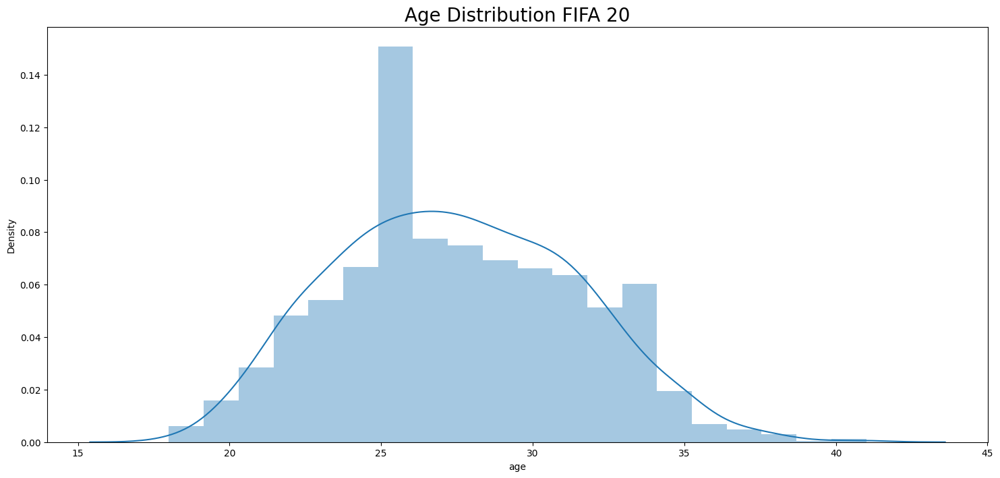

In [19]:
plt.figure(figsize=(18,8))
plt.title('Age Distribution FIFA 20', fontsize=20)
sns.distplot(a=df_20['age'], kde=True, bins=20)

<ipython-input-20-99857d4642fa>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




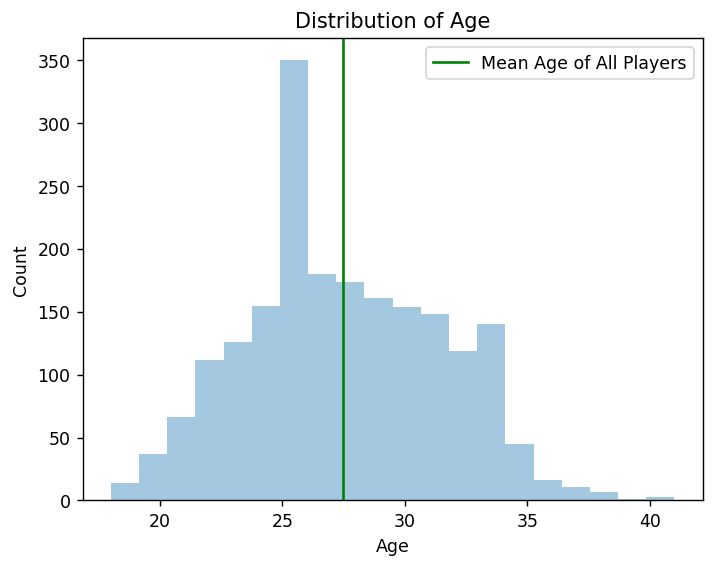

In [20]:
plt.figure(dpi=125)
sns.distplot(a=df_20['age'],kde=False,bins=20)
plt.axvline(x=np.mean(df_20['age']),c='green',label='Mean Age of All Players')
plt.legend()
plt.xlabel('Age')
plt.ylabel('Count')
plt.title('Distribution of Age')
plt.show()

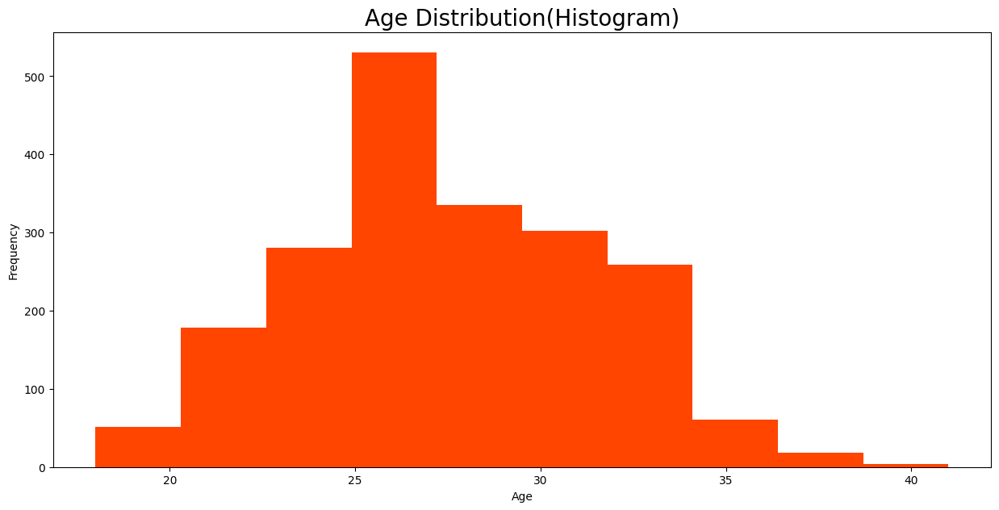

In [21]:
plt.figure(figsize = (15, 7))
df_20['age'].plot(kind="hist", color="orangered")
plt.title("Age Distribution(Histogram)", fontsize=20)
plt.xlabel("Age")
plt.show()

<ipython-input-22-1bb88bca7e7c>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




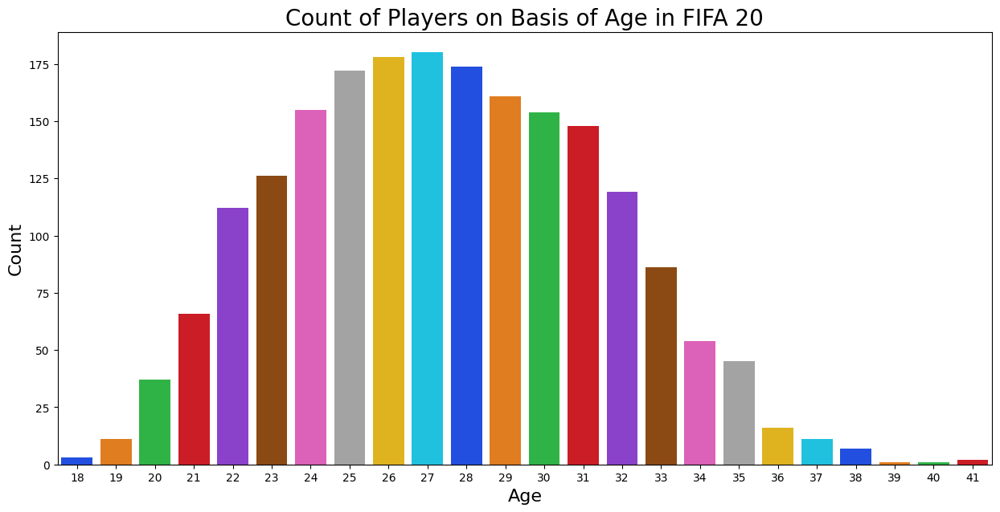

In [22]:
plt.figure(figsize= (15,7))

ax = sns.countplot(x='age', data=df_20, palette='bright')
ax.set_title(label='Count of Players on Basis of Age in FIFA 20', fontsize=20)

ax.set_xlabel(xlabel='Age', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)

plt.show()

In [23]:
print(df_20.nationality.unique())

['Argentina' 'Portugal' 'Brazil' 'Slovenia' 'Belgium' 'Germany'
 'Netherlands' 'Croatia' 'Egypt' 'France' 'Senegal' 'England' 'Spain'
 'Italy' 'Uruguay' 'Poland' 'Denmark' 'Gabon' 'Korea Republic'
 'Costa Rica' 'Slovakia' 'Bosnia Herzegovina' 'Serbia' 'Scotland'
 'Hungary' 'Switzerland' 'Greece' 'Austria' 'Morocco' 'Sweden' 'Wales'
 'Colombia' 'Czech Republic' 'Chile' 'Algeria' 'Ivory Coast' 'Togo'
 'Norway' 'Mexico' 'Iceland' 'Finland' 'Jamaica' 'Albania' 'Guinea'
 'Cameroon' 'Ghana' 'Montenegro' 'Ukraine' 'Russia' 'DR Congo'
 'Central African Rep.' 'Venezuela' 'Nigeria' 'Armenia' 'Israel' 'Ecuador'
 'Paraguay' 'Australia' 'Turkey' 'Romania' 'Japan' 'Mali' 'United States'
 'Kosovo' 'Dominican Republic' 'Tanzania' 'China PR' 'Northern Ireland'
 'Republic of Ireland' 'Tunisia' 'Cape Verde' 'FYR Macedonia'
 'Burkina Faso' 'Kenya' 'Angola' 'South Africa' 'Peru' 'Syria' 'Gambia'
 'New Zealand' 'Equatorial Guinea' 'Zimbabwe' 'Georgia' 'Canada' 'Estonia'
 'Benin' 'Bulgaria' 'Mozambique' 'Hon

In [ ]:
print(len(df_20.nationality.unique()))

97


<ipython-input-24-de9ebde988c7>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




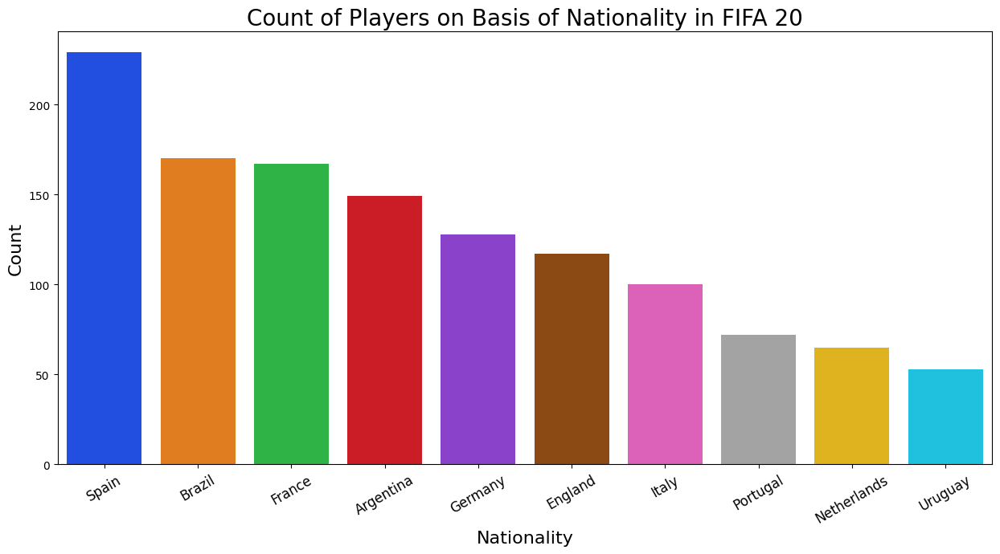

In [24]:
plt.figure(figsize= (15, 7))

ax = sns.countplot(x='nationality', data=df_20, palette='bright', order=df_20.nationality.value_counts().iloc[:10].index)
ax.set_title(label='Count of Players on Basis of Nationality in FIFA 20', fontsize=20)

ax.set_xlabel(xlabel='Nationality', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)
plt.xticks(rotation=30, fontsize=12)

plt.show()

In [25]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = df_20['nationality'],
    y = df_20['overall'],
    mode='markers',
    marker=dict(
        size=16,
        color=df_20['overall'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales
        showscale=True
    ),
    text= df_20['short_name'],
))

fig.update_layout(title='Nationality vs Overall Rating',
                  xaxis_title='Nationality',
                  yaxis_title='Overall Rating',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

<ipython-input-26-2d72caf54f02>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: title={'center': 'Height(in centimeters) Distribution FIFA 20'}, xlabel='height_cm', ylabel='Density'>

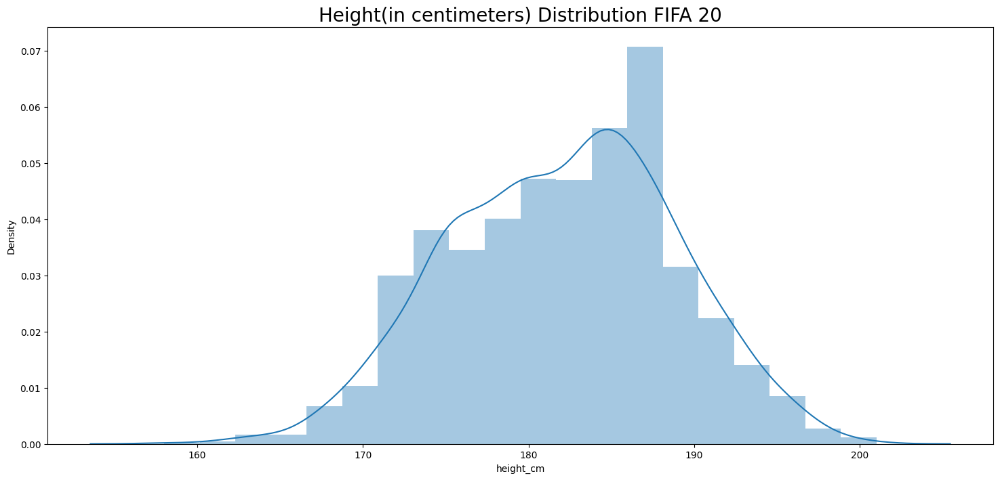

In [26]:
plt.figure(figsize=(18,8))
plt.title('Height(in centimeters) Distribution FIFA 20', fontsize=20)
sns.distplot(a=df_20['height_cm'], kde=True, bins=20)

<ipython-input-27-fcf05b845096>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




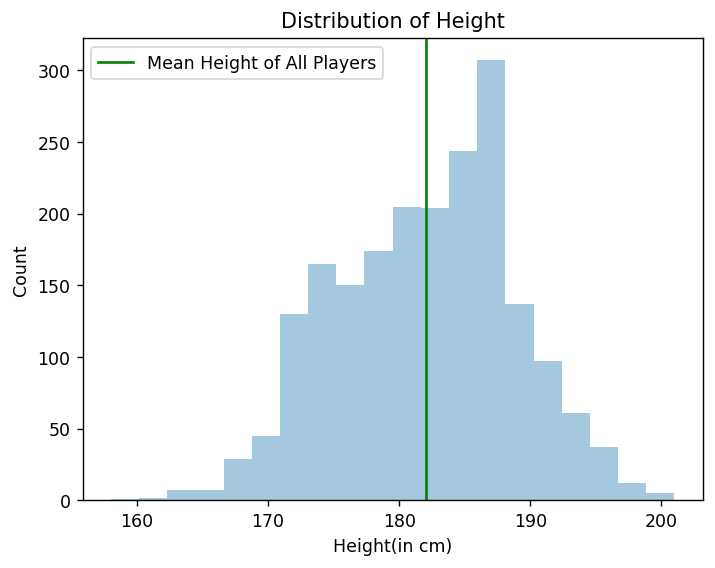

In [27]:
plt.figure(dpi=125)
sns.distplot(a=df_20['height_cm'],kde=False,bins=20)
plt.axvline(x=np.mean(df_20['height_cm']),c='green',label='Mean Height of All Players')
plt.legend()
plt.xlabel('Height(in cm)')
plt.ylabel('Count')
plt.title('Distribution of Height')
plt.show()

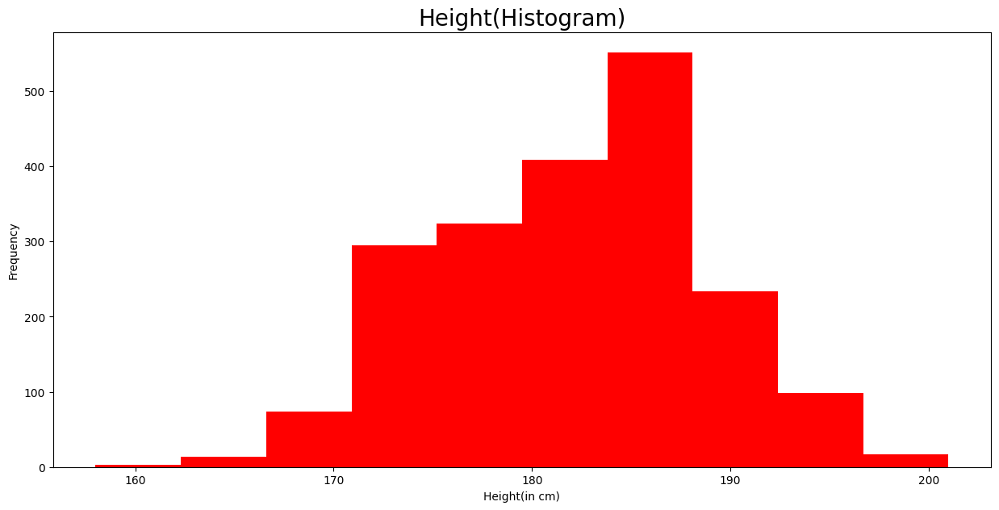

In [28]:
plt.figure(figsize = (15, 7))
df_20['height_cm'].plot(kind="hist", color="red")
plt.title("Height(Histogram)", fontsize=20)
plt.xlabel("Height(in cm)")
plt.show()

<ipython-input-29-ae04bcef407b>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




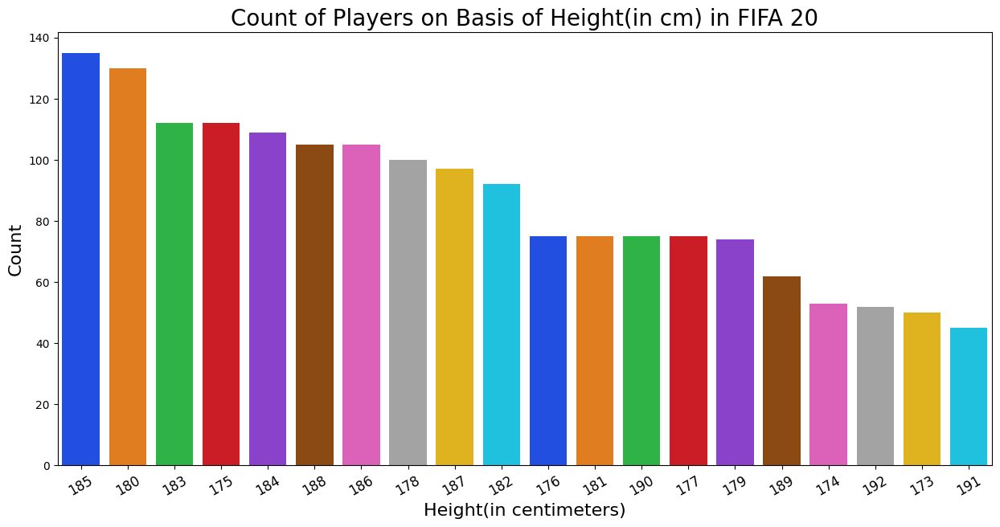

In [29]:
plt.figure(figsize= (15, 7))

ax = sns.countplot(x='height_cm', data=df_20, palette='bright', order=df_20.height_cm.value_counts().iloc[:20].index)
ax.set_title(label='Count of Players on Basis of Height(in cm) in FIFA 20', fontsize=20)

ax.set_xlabel(xlabel='Height(in centimeters)', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)
plt.xticks(rotation=30, fontsize=12)

plt.show()

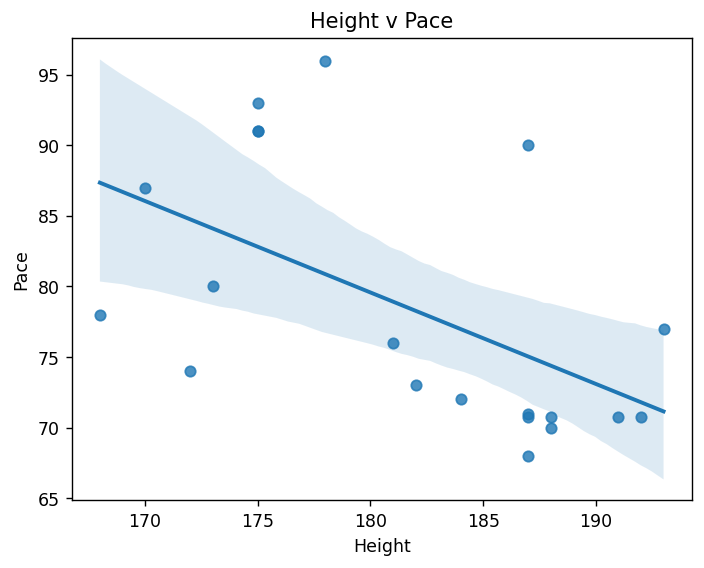

In [30]:
plt.figure(dpi=125)
x = df_20.head(20)['height_cm']
y = df_20.head(20)['pace']

# Pass x and y as keyword arguments
sns.regplot(x=x, y=y)
plt.title('Height v Pace')
plt.xlabel('Height')
plt.ylabel('Pace')
plt.show()

<ipython-input-31-6ccb10ccc468>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: title={'center': 'Weight(in kg) Distribution FIFA 20'}, xlabel='weight_kg', ylabel='Density'>

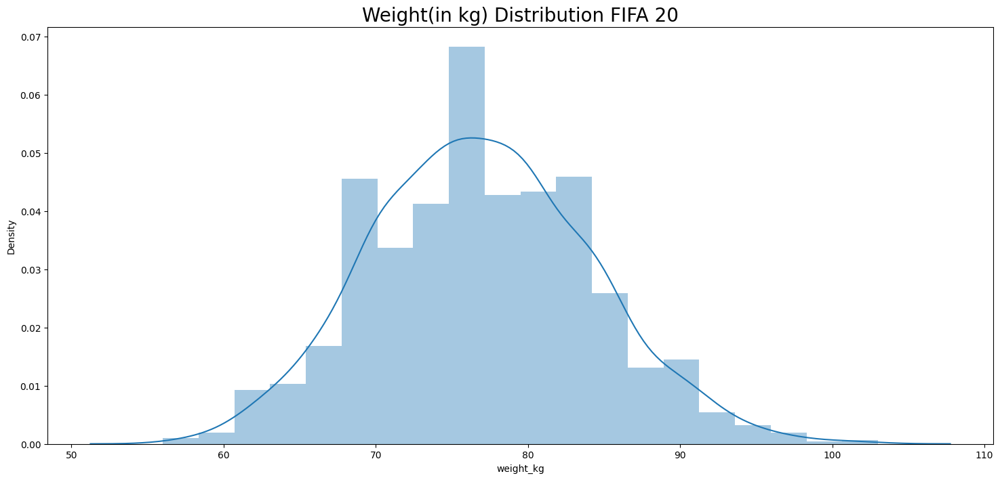

In [31]:
plt.figure(figsize=(18,8))
plt.title('Weight(in kg) Distribution FIFA 20', fontsize=20)
sns.distplot(a=df_20['weight_kg'], kde=True, bins=20)

<ipython-input-32-8ad0aea86174>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




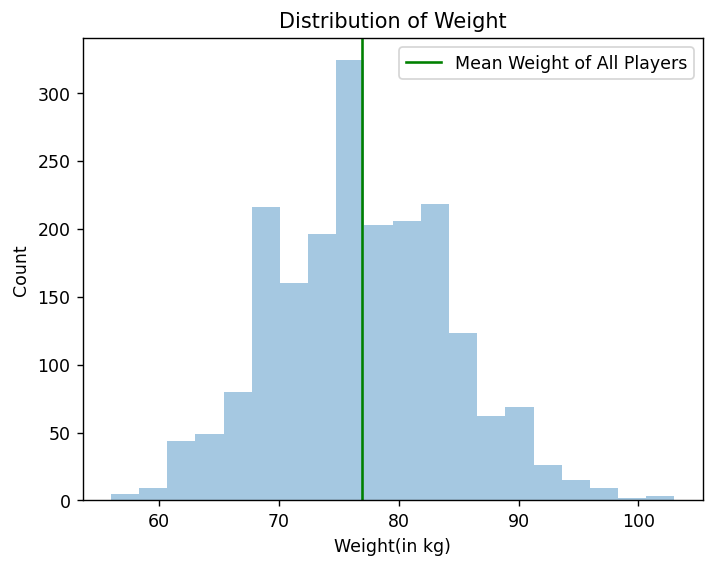

In [32]:
plt.figure(dpi=125)
sns.distplot(a=df_20['weight_kg'],kde=False,bins=20)
plt.axvline(x=np.mean(df_20['weight_kg']),c='green',label='Mean Weight of All Players')
plt.legend()
plt.xlabel('Weight(in kg)')
plt.ylabel('Count')
plt.title('Distribution of Weight')
plt.show()

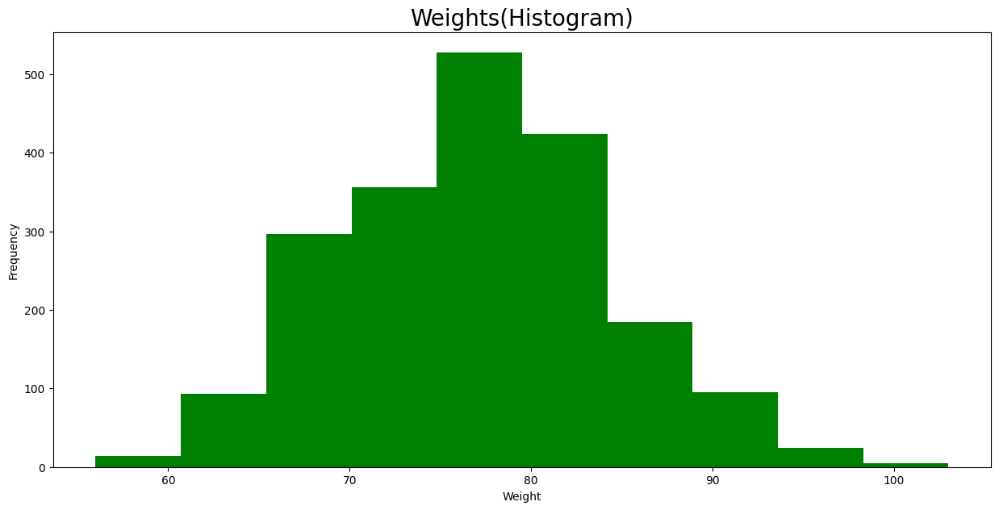

In [33]:
plt.figure(figsize = (15, 7))
df_20['weight_kg'].plot(kind="hist", color="green")
plt.title("Weights(Histogram)", fontsize=20)
plt.xlabel("Weight")
plt.show()

<ipython-input-34-4190ab8ace48>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




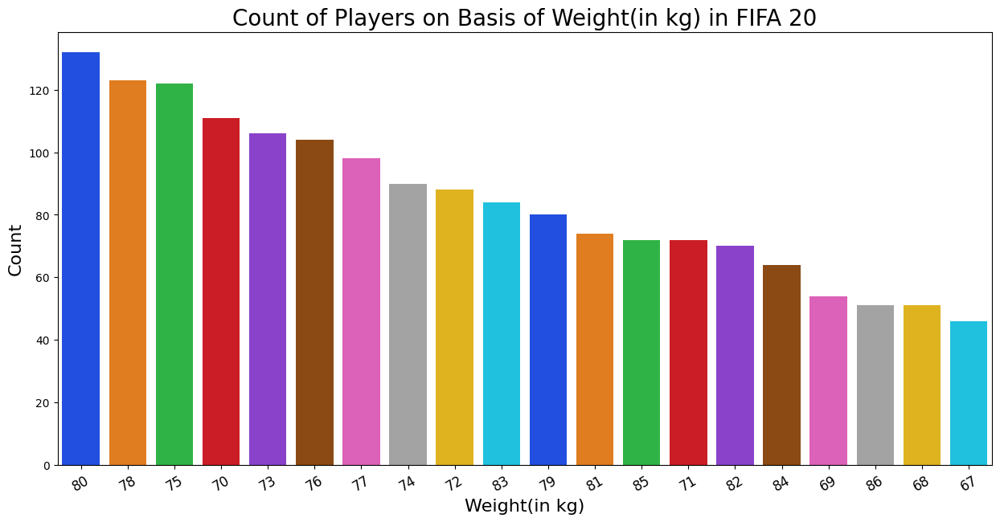

In [34]:
plt.figure(figsize= (15, 7))

ax = sns.countplot(x='weight_kg', data=df_20, palette='bright', order=df_20.weight_kg.value_counts().iloc[:20].index)
ax.set_title(label='Count of Players on Basis of Weight(in kg) in FIFA 20', fontsize=20)

ax.set_xlabel(xlabel='Weight(in kg)', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)
plt.xticks(rotation=30, fontsize=12)

plt.show()

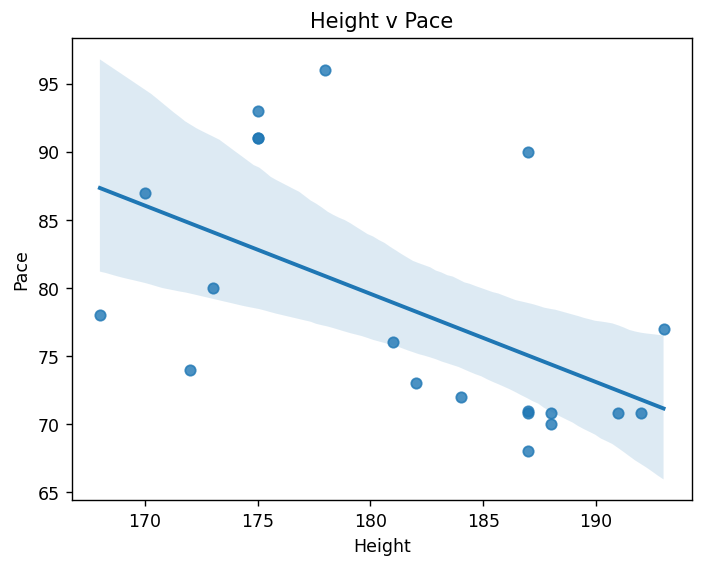

In [35]:
plt.figure(dpi=125)
x = df_20.head(20)['height_cm']
y = df_20.head(20)['pace']

# Pass x and y as keyword arguments
sns.regplot(x=x, y=y)
plt.title('Height v Pace')
plt.xlabel('Height')
plt.ylabel('Pace')
plt.show()

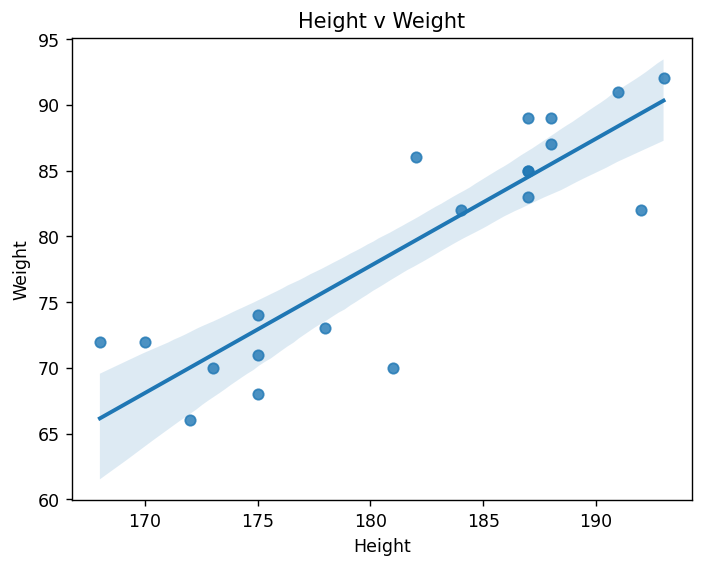

In [36]:
df_20 = pd.read_csv("/content/players_20.csv")
plt.figure(dpi=125)
x=df_20.head(20)['height_cm']
y=df_20.head(20)['weight_kg']

sns.regplot(x=x, y=y) #the arguments must be passed by keyword
# the other sns.regplot(x,y) is redundant
plt.title('Height v Weight')
plt.xlabel('Height')
plt.ylabel('Weight')
plt.show()

<Axes: xlabel='height_cm', ylabel='weight_kg'>

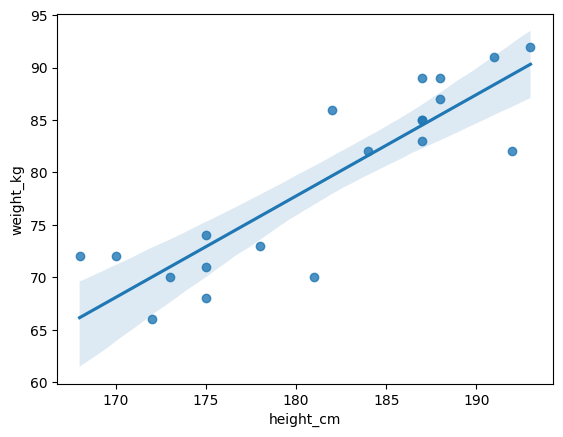

In [37]:
sns.regplot(x=x, y=y) #the arguments must be passed by keyword

In [38]:
df_20['bmi'] = df_20['weight_kg'] // (df_20['height_cm']/100)**2
df_20['bmi'].head(20)

,bmi
0,24
1,23
2,22
3,24
4,24
5,21
6,24
7,24
8,22
9,23


<ipython-input-39-4f103ca5dcf1>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




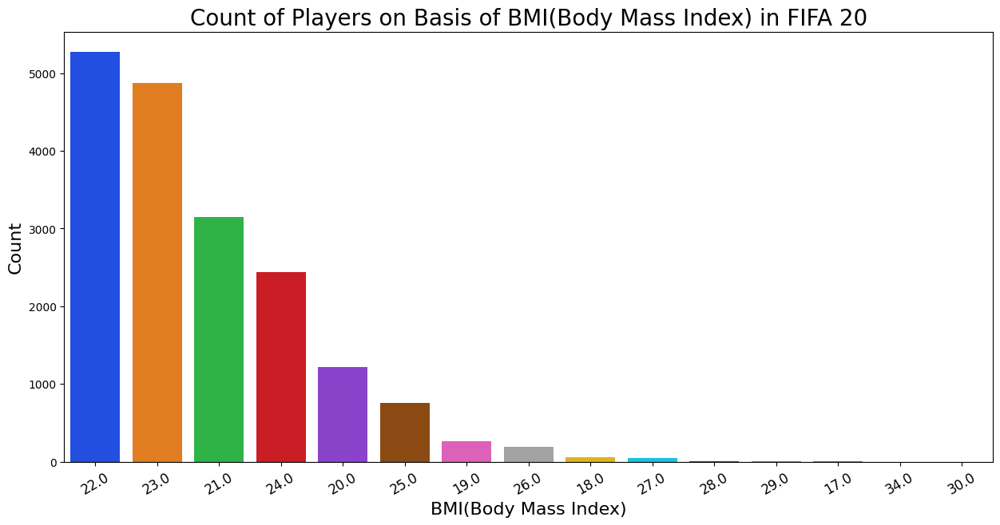

In [39]:
plt.figure(figsize= (15, 7))

ax = sns.countplot(x='bmi', data=df_20, palette='bright', order=df_20.bmi.value_counts().iloc[:20].index)
ax.set_title(label='Count of Players on Basis of BMI(Body Mass Index) in FIFA 20', fontsize=20)

ax.set_xlabel(xlabel='BMI(Body Mass Index)', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)
plt.xticks(rotation=30, fontsize=12)

plt.show()

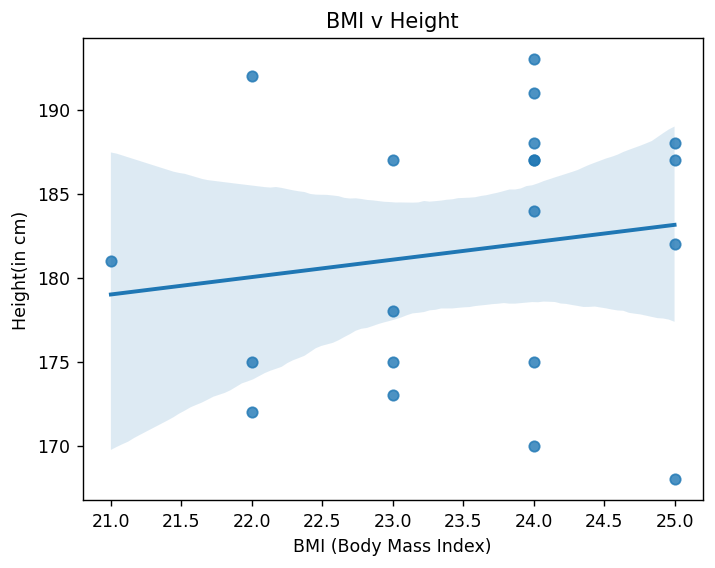

In [40]:
plt.figure(dpi=125)
x = df_20.head(20)['bmi']
y = df_20.head(20)['height_cm']

sns.regplot(x=x, y=y)  # Pass x and y as keyword arguments
plt.title('BMI v Height')
plt.xlabel('BMI (Body Mass Index)')
plt.ylabel('Height(in cm)')
plt.show()

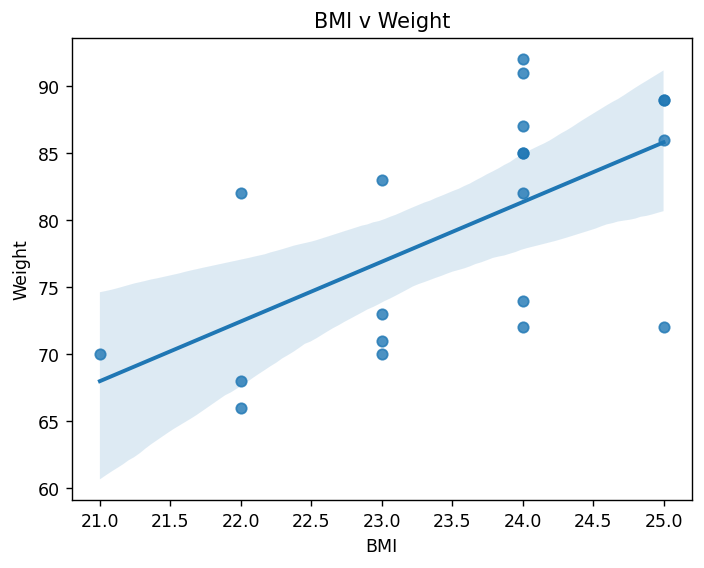

In [41]:
plt.figure(dpi=125)
x=df_20.head(20)['bmi']
y=df_20.head(20)['weight_kg']
sns.regplot(x=x, y=y)
plt.title('BMI v Weight')
plt.xlabel('BMI')
plt.ylabel('Weight')
plt.show()

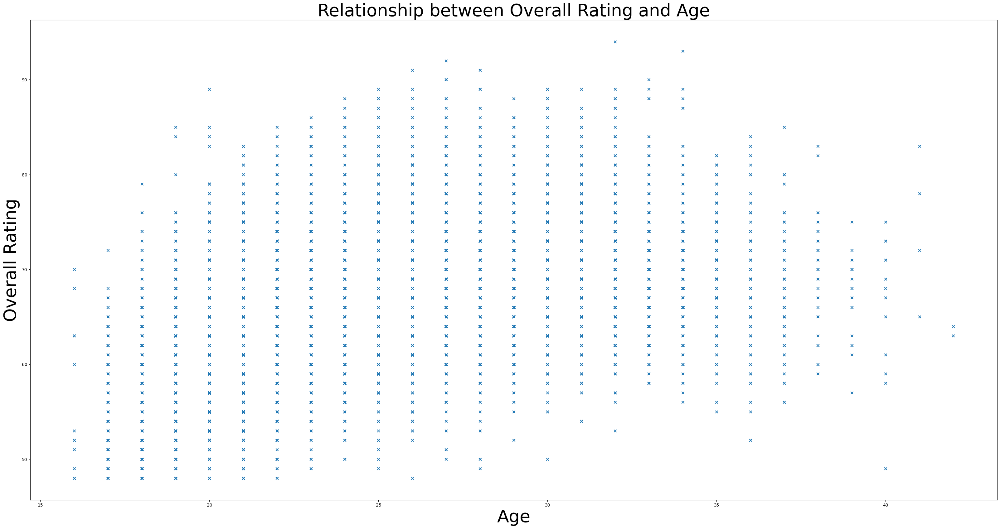

In [42]:
plt.figure(figsize=(40, 20))
plt.scatter(df_20['age'], df_20['overall'], marker="x")
plt.ylabel('Overall Rating', fontsize=40)
plt.xlabel("Age", fontsize=40)
plt.title("Relationship between Overall Rating and Age", fontsize=40)
plt.show()

<ipython-input-43-e15239b67614>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: title={'center': 'Overall Rating Distribution FIFA 20'}, xlabel='overall', ylabel='Density'>

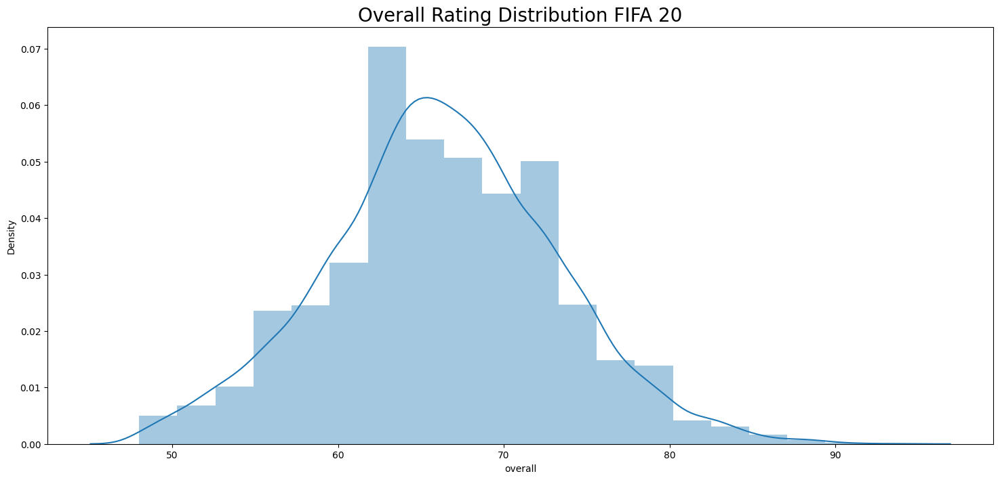

In [43]:
plt.figure(figsize=(18,8))
plt.title('Overall Rating Distribution FIFA 20', fontsize=20)
sns.distplot(a=df_20['overall'], kde=True, bins=20)

<ipython-input-44-4ad1f4b62832>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




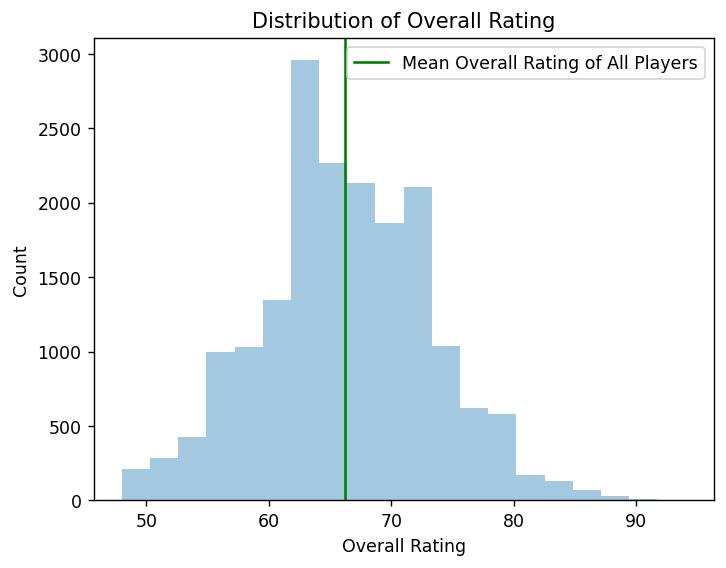

In [44]:
plt.figure(dpi=125)
sns.distplot(a=df_20['overall'],kde=False,bins=20)
plt.axvline(x=np.mean(df_20['overall']),c='green',label='Mean Overall Rating of All Players')
plt.legend()
plt.xlabel('Overall Rating')
plt.ylabel('Count')
plt.title('Distribution of Overall Rating')
plt.show()

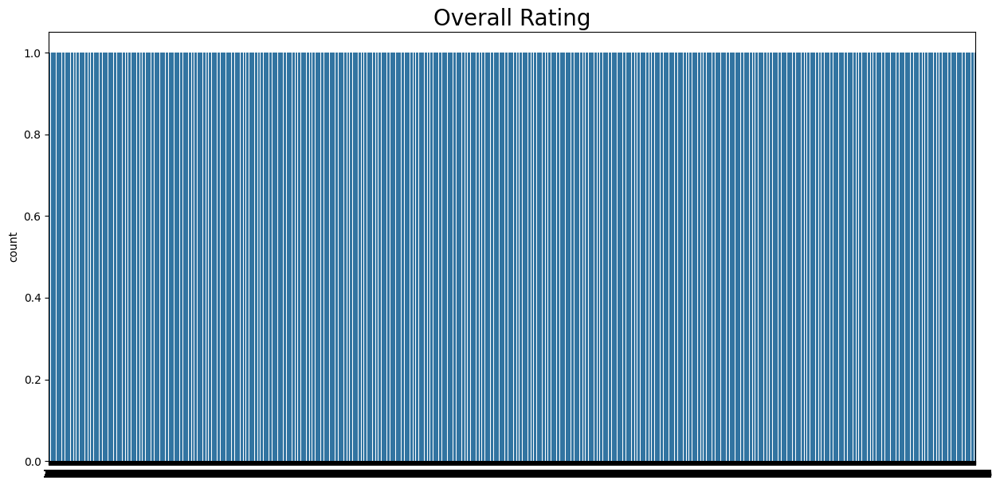

In [46]:
plt.figure(figsize=(15, 7))
sns.countplot(df_20['overall'])
plt.title("Overall Rating", fontsize=20)
plt.show()


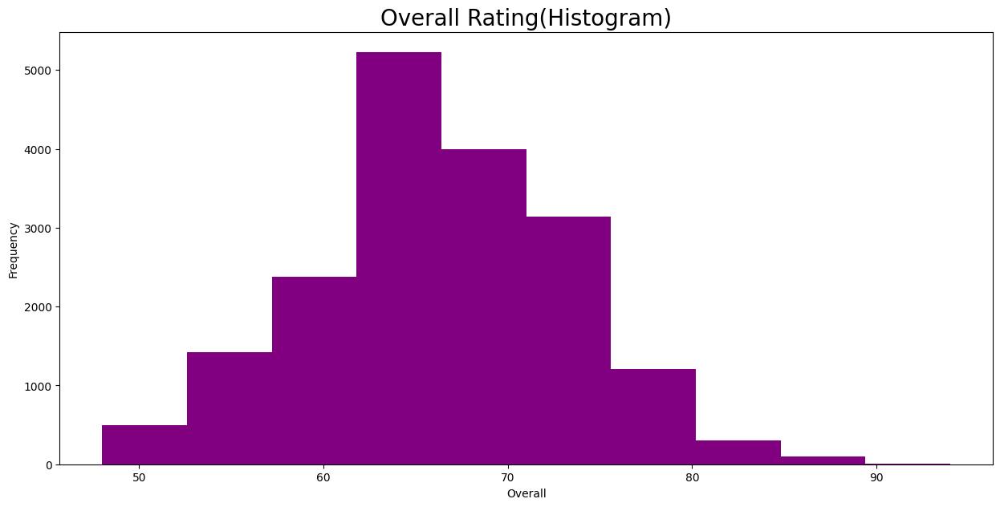

In [47]:
plt.figure(figsize = (15, 7))
df_20['overall'].plot(kind="hist", color="purple")
plt.title("Overall Rating(Histogram)", fontsize=20)
plt.xlabel("Overall")
plt.show()

<ipython-input-48-12241269366b>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




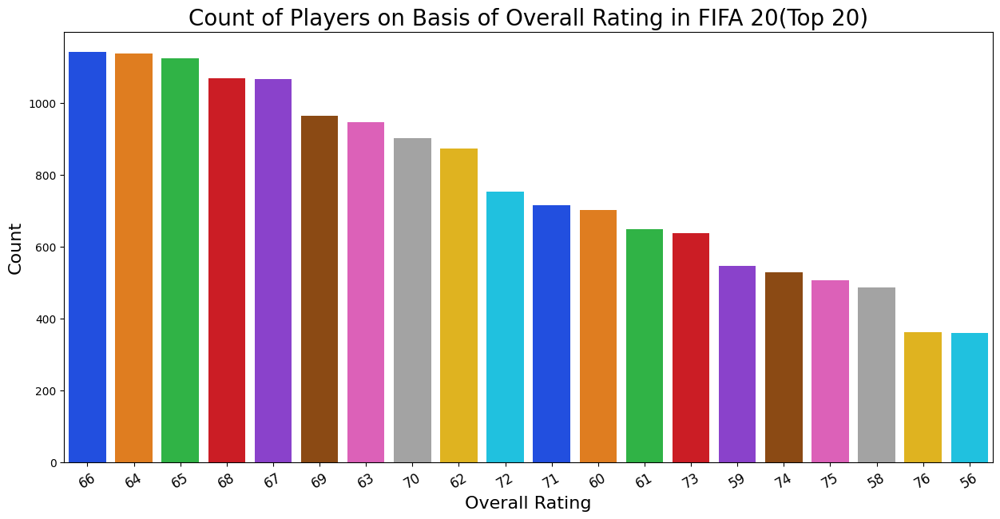

In [48]:
plt.figure(figsize= (15, 7))

ax = sns.countplot(x='overall', data=df_20, palette='bright', order=df_20.overall.value_counts().iloc[:20].index)
ax.set_title(label='Count of Players on Basis of Overall Rating in FIFA 20(Top 20)', fontsize=20)

ax.set_xlabel(xlabel='Overall Rating', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)
plt.xticks(rotation=30, fontsize=12)

plt.show()

<ipython-input-49-cb492a1cafd3>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




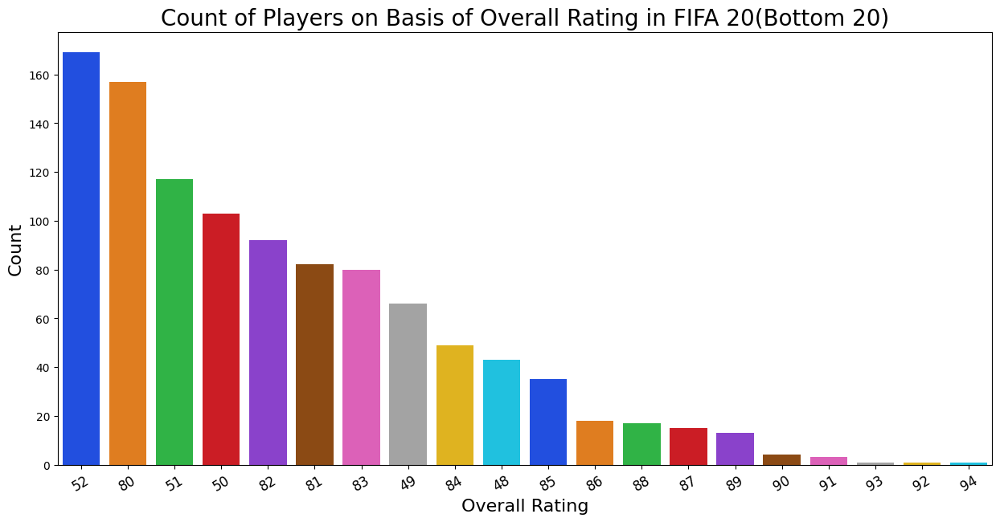

In [49]:
plt.figure(figsize= (15, 7))

ax = sns.countplot(x='overall', data=df_20, palette='bright', order=df_20.overall.value_counts().iloc[-20:].index)
ax.set_title(label='Count of Players on Basis of Overall Rating in FIFA 20(Bottom 20)', fontsize=20)

ax.set_xlabel(xlabel='Overall Rating', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)
plt.xticks(rotation=30, fontsize=12)

plt.show()

In [50]:
fig = go.Figure()
data = df_20.sort_values(by='nationality')

fig.add_trace(go.Box(
    x=data['nationality'],
    y=data['bmi'],
    name="Suspected Outliers",
    boxpoints="suspectedoutliers",
    marker=dict(
        size=12,
        color='rgb(180, 222, 43)',
        outliercolor='rgba(31, 158, 137, 0.6)',
        line=dict(
            outliercolor='rgba(31, 158, 137, 0.6)',
            outlierwidth=2
        )
    ),
    line_color='rgba(72, 40, 120)',
    text=data['short_name']
))

fig.update_layout(title='Styled Box Plot (with Suspected Outliers) - Nationality vs BMI',
                  xaxis_title='Nationality',
                  yaxis_title='BMI',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(family='Cambria, monospace', size=12, color='#000000'),
                  xaxis_rangeslider_visible=True)
fig.show()

<ipython-input-51-b7580e130398>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




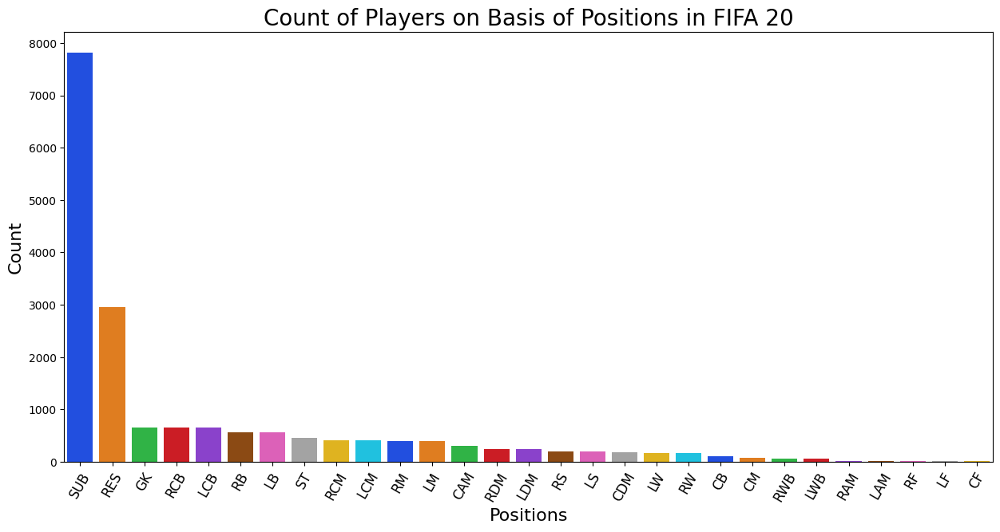

In [51]:
plt.figure(figsize= (15, 7))

ax = sns.countplot(x='team_position', data=df_20, palette='bright', order=df_20.team_position.value_counts().index)
ax.set_title(label='Count of Players on Basis of Positions in FIFA 20', fontsize=20)

ax.set_xlabel(xlabel='Positions', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)
plt.xticks(rotation=60, fontsize=12)

plt.show()

In [52]:
attack = ['LW', 'RW', 'ST', 'LF', 'RF', 'CF', 'LS', 'RS']
data = df_20.query('team_position in @attack')
fig = px.pie(data, names='team_position',
             color_discrete_sequence=px.colors.sequential.Bluered,
             title='Percentages of Player Attacking Positions')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

In [53]:
defence = ['LWB', 'RWB', 'CB', 'LB', 'RB', 'LCB', 'RCB']
data = df_20.query('team_position in @defence')
fig = px.pie(data, names='team_position',
             color_discrete_sequence=px.colors.sequential.Sunsetdark,
             title='Percentages of Player Defending Positions')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

In [54]:
mid = ['CM', 'RCM', 'LCM', 'RM', 'LM', 'CAM', 'RDM', 'LDM', 'CDM', 'RAM', 'LAM']
data = df_20.query('team_position in @mid')
fig = px.pie(data, names='team_position',
             color_discrete_sequence=px.colors.sequential.Agsunset,
             title='Percentages of Player Midfield Positions')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

In [55]:
df_20['short_name'][df_20['overall']==max(df_20['overall'])]


,short_name
0,L. Messi


In [56]:
df_20['overall'].mean()

66.24499398183609

In [57]:
df_20_top_rated = df_20.sort_values(by=["overall"], ascending=False)
df_20_top_rated.head(10)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,2e+08,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10,NaN,2004-07-01,2021,NaN,NaN,87,92,92,96,39,66,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,1e+08,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7,NaN,2018-07-10,2022,LS,7,90,93,82,89,35,78,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,23
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,2e+08,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10,NaN,2017-08-03,2022,LW,10,91,85,87,95,32,58,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,22
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,2e+08,NaN,GK,13,NaN,2014-07-16,2023,GK,1,NaN,NaN,NaN,NaN,NaN,NaN,87,92,78,89,52,90,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,2e+08,"#Speedster, #Dribbler, #Acrobat",LW,7,NaN,2019-07-01,2024,LF,10,91,83,86,94,35,66,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Selfish, Fin

In [58]:
fig = px.pie(df_20_top_rated.head(25), names='club',
             title='Percentage of Clubs in top 25 players')
fig.show()

In [59]:
fig = px.pie(df_20_top_rated.head(25), names='nationality',
             title='Percentage of Nations in top 25 players')
fig.show()

In [60]:
df_20_high_value = df_20.sort_values(by=['value_eur'], ascending=False)
df_20_high_value.head(10)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,2e+08,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10,NaN,2017-08-03,2022,LW,10,91,85,87,95,32,58,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,22
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,2e+08,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10,NaN,2004-07-01,2021,NaN,NaN,87,92,92,96,39,66,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24
10,231747,https://sofifa.com/player/231747/kylian-mbappe...,K. Mbappé,Kylian Mbappé,20,1998-12-20,178,73,France,Paris Saint-Germain,89,95,93500000,155000,"ST, RW",Right,3,4,5,High/Low,Normal,Yes,2e+08,"#Speedster, #Dribbler, #Acrobat",RW,7,NaN,2018-07-01,2022,RM,10,96,84,78,90,39,75,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Selfish, Early Crosser, Spe...",78,89,77,82,79,91,79,63,70,90,96,96,92,89,83,83,76,84,76,79,62,38,89,80,70,84,34,34,32,13,5,7,11,6,86+3,86+3,86+3,87+3,87+3,87+3,87+3,87+3,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,66+3,62+3,62+3,62+3,66+3,63+3,54+3,54+3,54+3,63+3,23
5,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,28,1991-06-28,181,70,Belgium,Manchester City,91,91,90000000,370000,"CAM, CM",Right,4,5,4,High/High,Normal,Yes,2e+08,"#Dribbler, #Playmaker , #Engine, #Distance Sh...",RCM,17,NaN,2015-08-30,2023,RCM,7,76,86,92,86,61,78,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Avoids Using Weaker Foot, Div...",93,82,55,92,82,86,85,83,91,91,77,76,78,91,76,91,63,89,74,90,76,61,88,94,79,91,68,58,51,15,13,5,10,13,82+3,82+3,82+3,87+3,87+3,87+3,87+3,87+3,88+3,88+3,88+3,88+3,87+3,87+3,87+3,88+3,77+3,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3,21
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,2e+08,"#Speedster, #Dribbler, #Acrobat",LW,7,NaN,2019-07-01,2024,LF,10,91,83,8

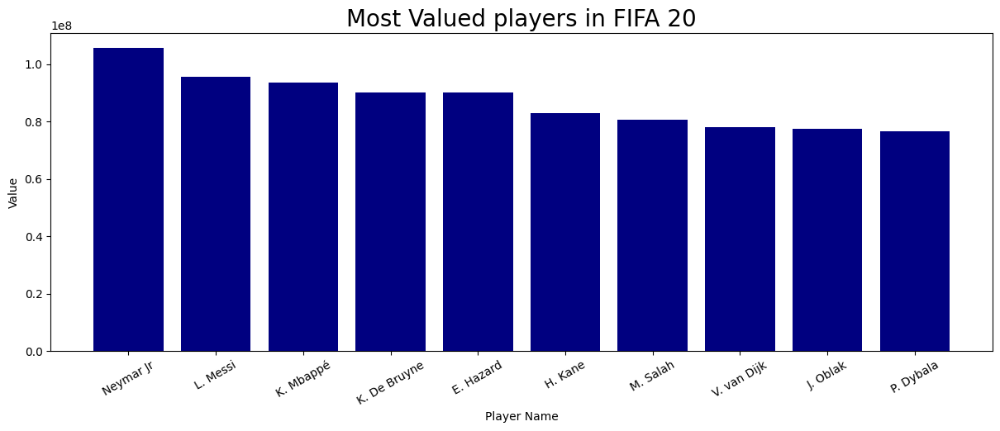

In [61]:
plt.figure(figsize = (50, 5))
plt.subplot(131)
plt.bar(df_20_high_value["short_name"].head(10), df_20_high_value["value_eur"].head(10), color='navy')
plt.tick_params(axis="x", rotation=30)
plt.ylabel("Value")
plt.xlabel("Player Name")

plt.title("Most Valued players in FIFA 20", fontsize=20)
plt.show()

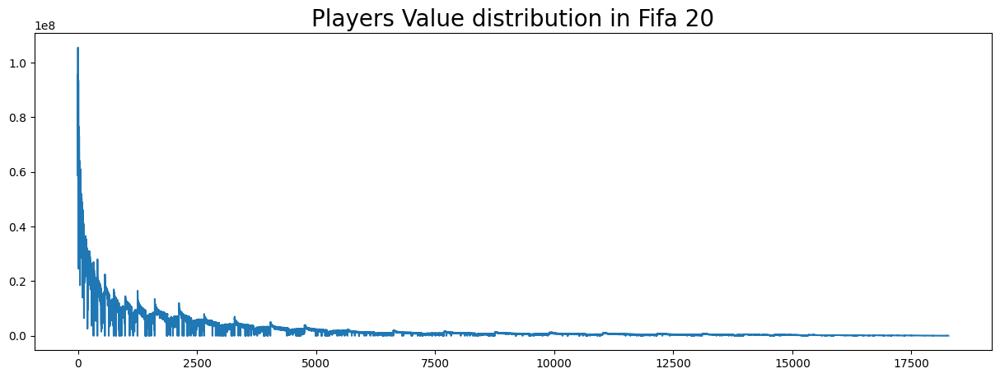

In [62]:
plt.rcParams['figure.figsize'] = (15, 5)
df_20['value_eur'].plot(kind="line")
plt.title("Players Value distribution in Fifa 20", fontsize=20)
plt.show()

In [63]:
df_20_high_release = df_20.sort_values(by=['release_clause_eur'], ascending=False)
df_20_high_release.head(10)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,2e+08,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10,NaN,2004-07-01,2021,NaN,NaN,87,92,92,96,39,66,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,2e+08,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10,NaN,2017-08-03,2022,LW,10,91,85,87,95,32,58,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,22
10,231747,https://sofifa.com/player/231747/kylian-mbappe...,K. Mbappé,Kylian Mbappé,20,1998-12-20,178,73,France,Paris Saint-Germain,89,95,93500000,155000,"ST, RW",Right,3,4,5,High/Low,Normal,Yes,2e+08,"#Speedster, #Dribbler, #Acrobat",RW,7,NaN,2018-07-01,2022,RM,10,96,84,78,90,39,75,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Selfish, Early Crosser, Spe...",78,89,77,82,79,91,79,63,70,90,96,96,92,89,83,83,76,84,76,79,62,38,89,80,70,84,34,34,32,13,5,7,11,6,86+3,86+3,86+3,87+3,87+3,87+3,87+3,87+3,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,66+3,62+3,62+3,62+3,66+3,63+3,54+3,54+3,54+3,63+3,23
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,2e+08,"#Speedster, #Dribbler, #Acrobat",LW,7,NaN,2019-07-01,2024,LF,10,91,83,86,94,35,66,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Selfish, Finesse Shot, Spee...",81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,83+3,83+3,83+3,89+3,88+3,88+3,88+3,89+3,89+3,89+3,89+3,89+3,83+3,83+3,83+3,89+3,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3,24
5,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,28,1991-06-28,181,70,Belgium,Manchester City,91,91,90000000,370000,"CAM, CM",Right,4,5,4,High/High,Normal,Yes,2e+08,"#Dribbler, #Playmaker , #Engine, #Distance Sh...",RCM,17,NaN,2015-08-30,2023,RCM,7,76,86,92,

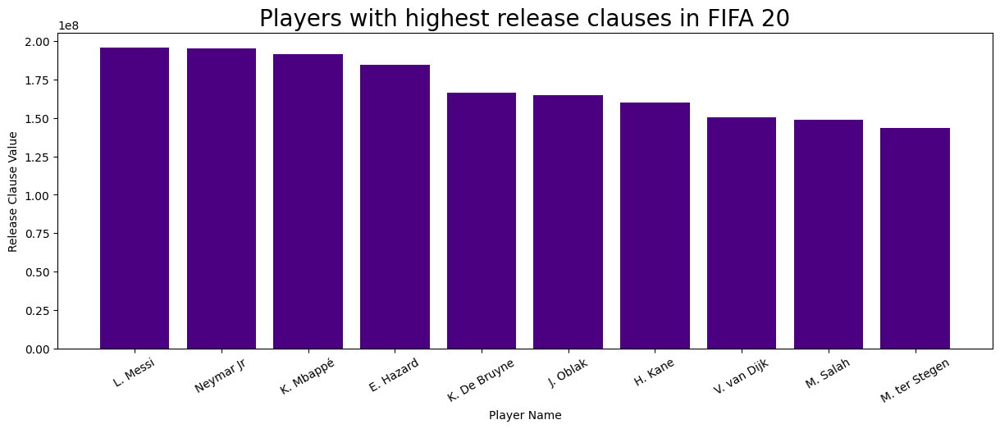

In [64]:
plt.figure(figsize = (50, 5))
plt.subplot(131)
plt.bar(df_20_high_release["short_name"].head(10), df_20_high_release["release_clause_eur"].head(10), color="indigo")
plt.tick_params(axis="x", rotation=30)
plt.ylabel("Release Clause Value")
plt.xlabel("Player Name")

plt.title("Players with highest release clauses in FIFA 20", fontsize=20)
plt.show()

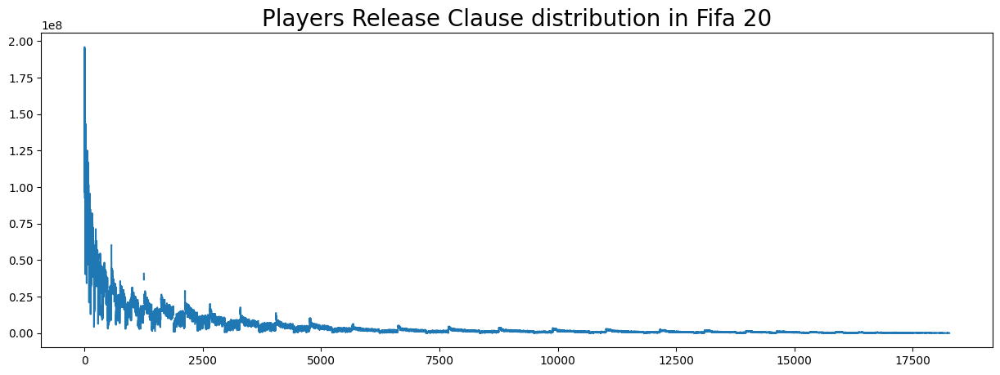

In [65]:
plt.rcParams['figure.figsize'] = (15, 5)
df_20['release_clause_eur'].plot(kind="line")
plt.title("Players Release Clause distribution in Fifa 20", fontsize=20)
plt.show()

In [66]:
print(df_20_high_release[:10]['age'].mean())
print(df_20_high_value[:10]['age'].mean())

26.7
26.5


<ipython-input-67-871cce250dca>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-67-871cce250dca>:9: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



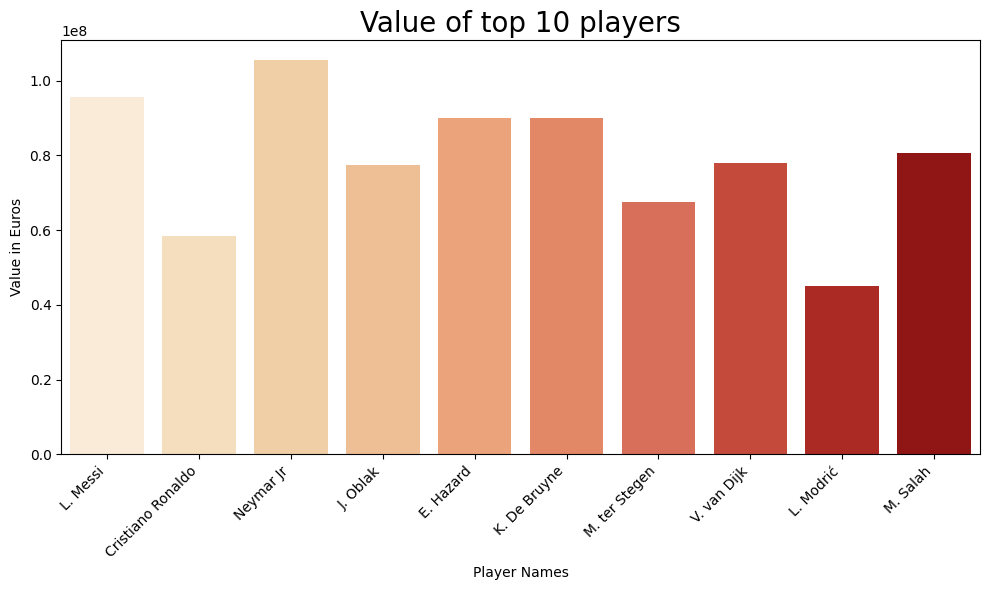

In [67]:
plt.figure(figsize=(10, 6))  # Create a figure and an axes. Adjust figure size if needed.
ax = sns.barplot(x='short_name', y='value_eur', data=df_20_top_rated.head(10), palette="OrRd")
# Use plt.title to set the plot title
plt.title("Value of top 10 players", fontsize=20)
#Add labels to the axis
plt.xlabel("Player Names")
plt.ylabel("Value in Euros")
#Adjust the rotation of the x tick labels
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right') # Correct rotation
plt.tight_layout()
plt.show()

<Axes: ylabel='value_eur'>

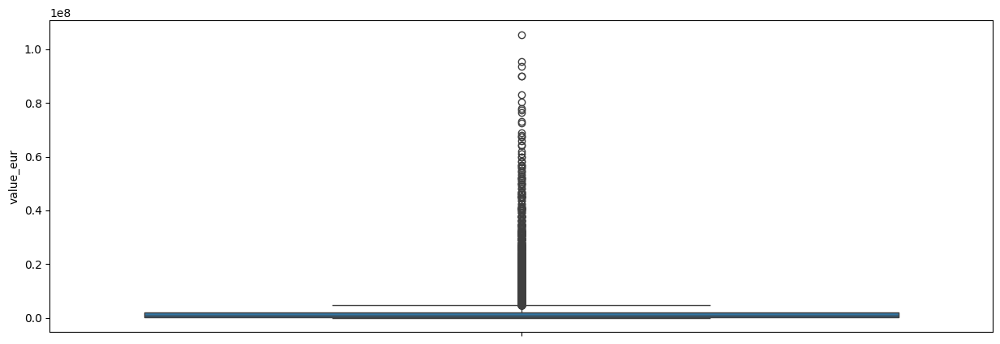

In [68]:
sns.boxplot(df_20['value_eur'])

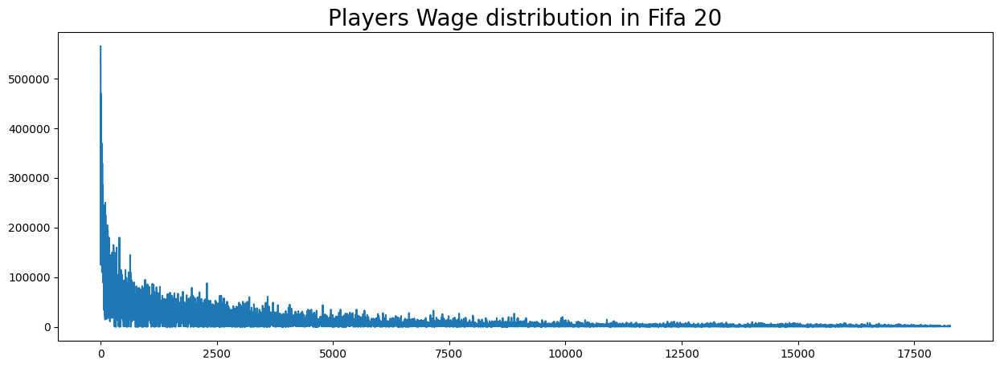

In [69]:
plt.rcParams['figure.figsize'] = (15, 5)
df_20['wage_eur'].plot(kind="line")
plt.title("Players Wage distribution in Fifa 20", fontsize=20)
plt.show()

In [70]:
df_20_high_wage = df_20.sort_values(by=['wage_eur'], ascending=False)

# Select the top 10 rows and the specified columns
result = df_20_high_wage.head(10)[['short_name', 'age', 'dob', 'height_cm', 'weight_kg']]

# Display the result
print(result)

           short_name  age         dob  height_cm  weight_kg
0            L. Messi   32  1987-06-24        170         72
4           E. Hazard   28  1991-01-07        175         74
1   Cristiano Ronaldo   34  1985-02-05        187         83
5        K. De Bruyne   28  1991-06-28        181         70
22       A. Griezmann   28  1991-03-21        176         73
19          L. Suárez   32  1987-01-24        182         86
8           L. Modrić   33  1985-09-09        172         66
36           T. Kroos   29  1990-01-04        183         76
17          S. Agüero   31  1988-06-02        173         70
21    Sergio Busquets   30  1988-07-16        189         76


<ipython-input-71-6b2ccbf8614d>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-71-6b2ccbf8614d>:6: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



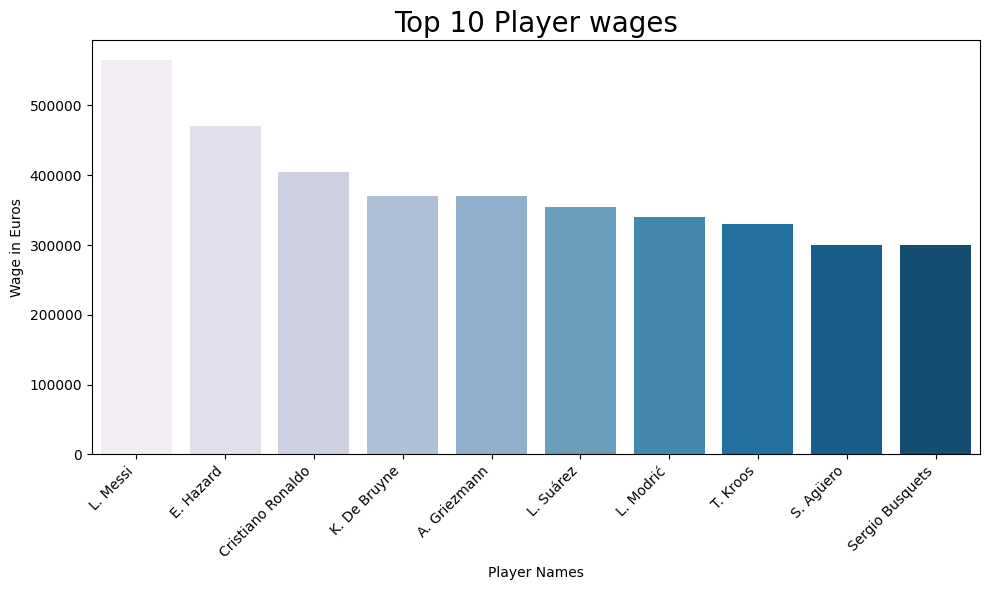

In [71]:
plt.figure(figsize=(10, 6))  # Create a figure and an axes. Adjust figure size if needed.
ax = sns.barplot(x='short_name', y='wage_eur', data=df_20_high_wage.head(10), palette="PuBu")
plt.title("Top 10 Player wages", fontsize=20)
plt.xlabel("Player Names")
plt.ylabel("Wage in Euros")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right') # Correct rotation
plt.tight_layout()
plt.show()

<ipython-input-72-2b7c83041149>:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




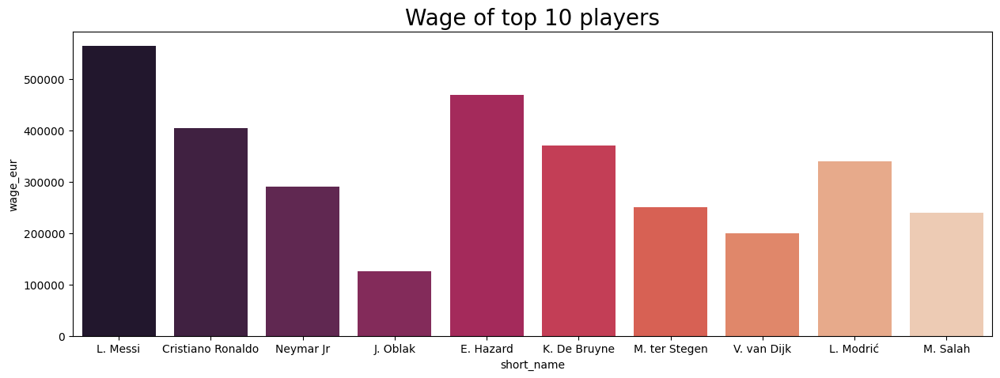

In [72]:
sns.barplot(
    x='short_name',
    y='wage_eur',
    data=df_20_top_rated.head(10),
    palette="rocket"
)

# Set the plot title
plt.title("Wage of top 10 players", fontsize=20)

# Show the plot
plt.show()

<Axes: ylabel='wage_eur'>

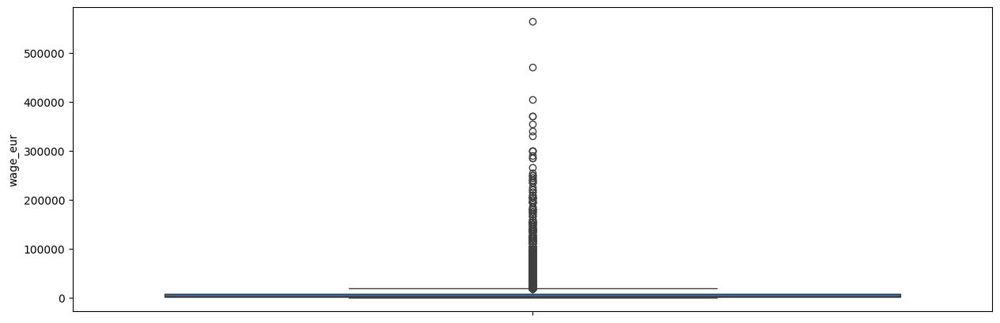

In [73]:
sns.boxplot(df_20['wage_eur'])


In [74]:
fig = px.scatter_3d(df_20_top_rated.head(20), x='potential', y='overall', z='wage_eur',
              color='short_name')
fig.update_layout(title='3D Plot of Potential, Overall and Wage in Euros of Top 20 FIFA Players')
fig.show()

In [75]:
fig = px.scatter_3d(df_20_top_rated.head(20), x='potential', y='overall', z='value_eur',
              color='short_name')
fig.update_layout(title='3D Plot of Potential, Overall and Value in Euros of Top 20 FIFA Players')
fig.show()

In [84]:
df_20_top_attackers = df_20[df_20['team_position'].str.contains('ST|RW|LW|CF|LS|RS', na=False)].sort_values(by="overall", ascending=False).head(10)
#print(df_20_top_attackers) #This line was added for you to ensure the output is as expected

<ipython-input-85-5b926732b850>:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




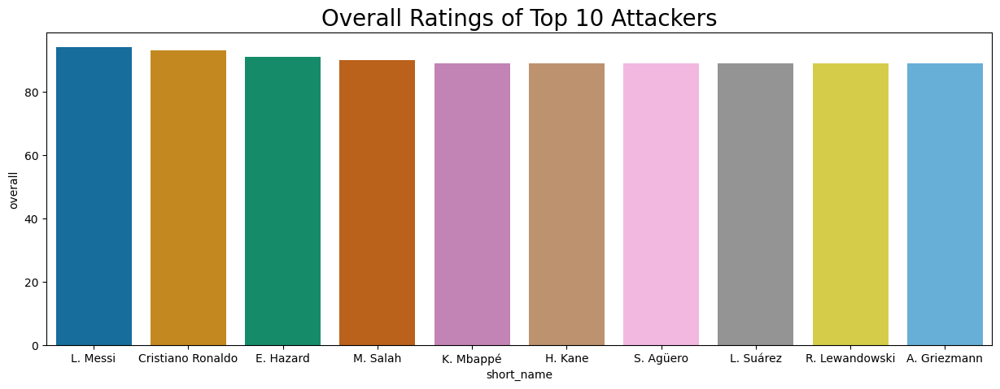

In [85]:
sns.barplot(
    x='short_name',
    y='overall',
    data=df_20_top_attackers.head(10),
    palette="colorblind"
)

# Set the plot title
plt.title("Overall Ratings of Top 10 Attackers", fontsize=20)

# Show the plot
plt.show()

<ipython-input-86-1ccf36574e2c>:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




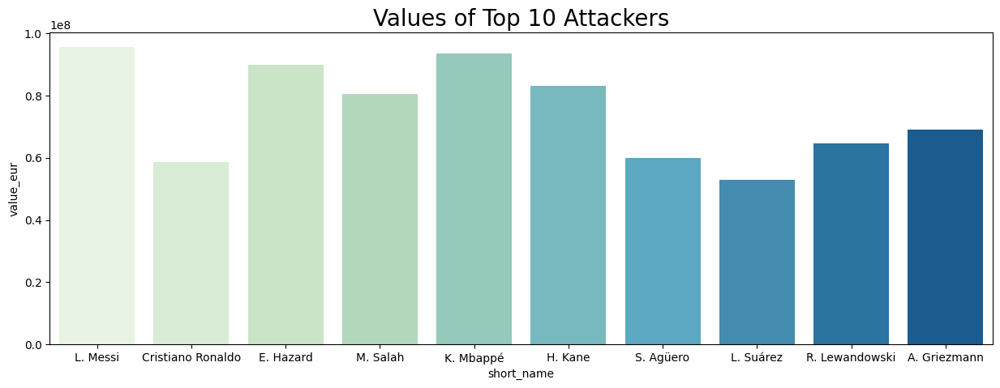

In [86]:
sns.barplot(
    x='short_name',
    y='value_eur',
    data=df_20_top_attackers.head(10),
    palette="GnBu"
)

# Set the plot title
plt.title("Values of Top 10 Attackers", fontsize=20)

# Show the plot
plt.show()

<ipython-input-87-7b5ecb8afa2a>:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




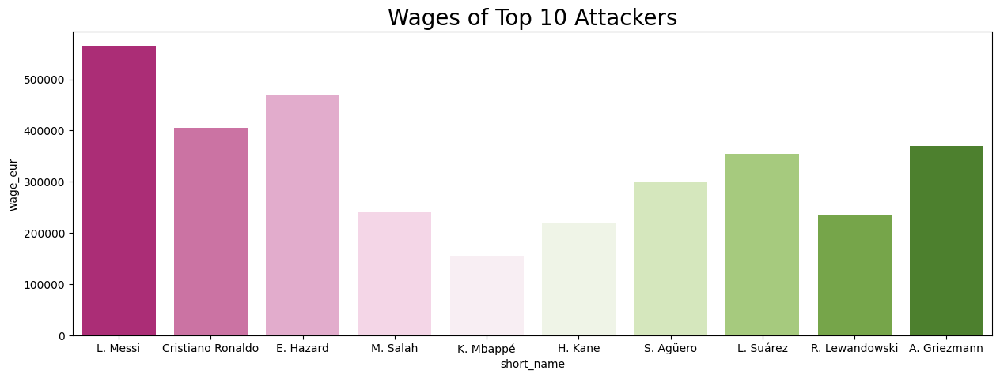

In [87]:
sns.barplot(
    x='short_name',
    y='wage_eur',
    data=df_20_top_attackers.head(10),
    palette="PiYG"
)

# Set the plot title
plt.title("Wages of Top 10 Attackers", fontsize=20)

# Show the plot
plt.show()

In [89]:
df_20_top_midfield = df_20[df_20['team_position'].str.contains('CM|CAM|CDM|LM|RM', na=False)].sort_values(by="overall", ascending=False)
df_20_top_midfield.head(10)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,2e+08,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10,NaN,2017-08-03,2022,LW,10,91,85,87,95,32,58,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,22
5,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,28,1991-06-28,181,70,Belgium,Manchester City,91,91,90000000,370000,"CAM, CM",Right,4,5,4,High/High,Normal,Yes,2e+08,"#Dribbler, #Playmaker , #Engine, #Distance Sh...",RCM,17,NaN,2015-08-30,2023,RCM,7,76,86,92,86,61,78,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Avoids Using Weaker Foot, Div...",93,82,55,92,82,86,85,83,91,91,77,76,78,91,76,91,63,89,74,90,76,61,88,94,79,91,68,58,51,15,13,5,10,13,82+3,82+3,82+3,87+3,87+3,87+3,87+3,87+3,88+3,88+3,88+3,88+3,87+3,87+3,87+3,88+3,77+3,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3,21
8,177003,https://sofifa.com/player/177003/luka-modric/2...,L. Modrić,Luka Modrić,33,1985-09-09,172,66,Croatia,Real Madrid,90,90,45000000,340000,CM,Right,4,4,4,High/High,Lean,Yes,9e+07,"#Dribbler, #Playmaker , #Crosser, #Acrobat, #...",RCM,10,NaN,2012-08-01,2020,NaN,NaN,74,76,89,89,72,66,NaN,NaN,NaN,NaN,NaN,NaN,"Argues with Officials, Finesse Shot, Speed Dri...",86,72,55,92,76,87,85,78,88,92,77,71,92,89,93,79,68,85,58,82,62,82,79,91,82,92,68,76,71,13,9,7,14,9,77+3,77+3,77+3,84+3,83+3,83+3,83+3,84+3,86+3,86+3,86+3,85+3,87+3,87+3,87+3,85+3,81+3,81+3,81+3,81+3,81+3,79+3,72+3,72+3,72+3,79+3,22
15,215914,https://sofifa.com/player/215914/ngolo-kante/2...,N. Kanté,N'Golo Kanté,28,1991-03-29,168,72,France,Chelsea,89,90,66000000,235000,"CDM, CM",Right,3,3,2,Medium/High,Normal,Yes,1e+08,"#Tackling , #Tactician",RCM,7,NaN,2016-07-16,2023,LDM,13,78,65,77,81,87,83,NaN,NaN,NaN,NaN,NaN,NaN,Diver,68,65,54,86,56,79,49,49,81,80,79,77,82,93,92,71,77,97,73,63,90,92,72,79,54,85,90,91,85,15,12,10,7,10,72+3,72+3,72+3,77+3,76+3,76+3,76+3,77+3,78+3,78+3,78+3,79+3,82+3,82+3,82+3,79+3,85+3,87+3,87+3,87+3,85+3,84+3,83+3,83+3,83+3,84+3,25
21,189511,https://sofifa.com/player/189511/sergio-busque...,Sergio Busquets,Sergio Busquets i Burgos,30,1988-07-16,189,76,Spain,FC Barcelona,89,89,55000000,300000,"CDM, CM",Right,4,3,3,Medium/Medium,Lean,Yes,1e+08,"#Playmaker , #Tactician",CDM,5,NaN,2008-09-01,2023,CDM,5,42,62,80,80,85,80,NaN,NaN,NaN,NaN,NaN,NaN,Giant Throw-in,62,67,68,89,44,80,66,68,82,88,4

<ipython-input-90-c78f61bd71cd>:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




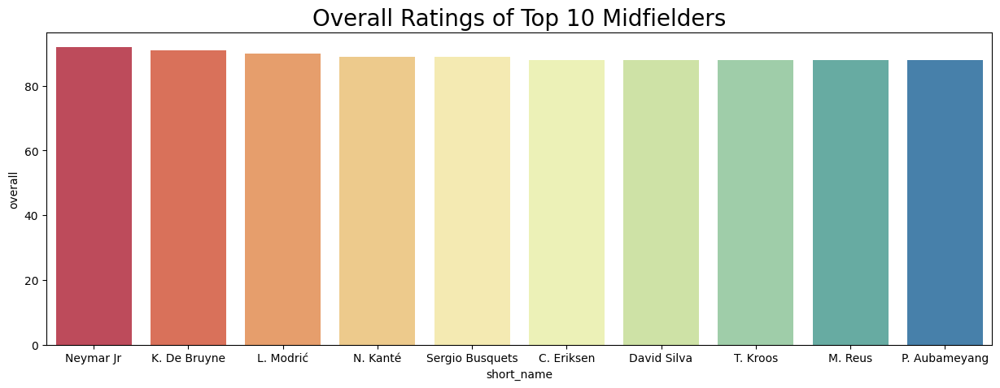

In [90]:
sns.barplot(
    x='short_name',
    y='overall',
    data=df_20_top_midfield.head(10),
    palette="Spectral"
)

# Set the plot title
plt.title("Overall Ratings of Top 10 Midfielders", fontsize=20)

# Show the plot
plt.show()

<ipython-input-91-63db7fe28fd7>:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




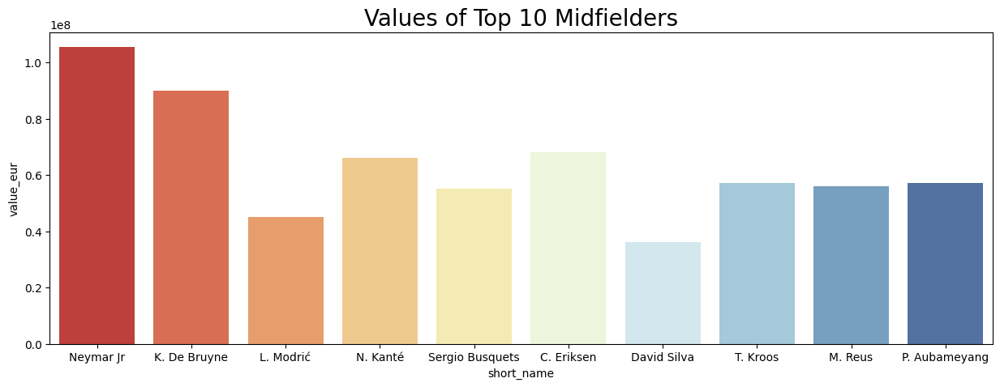

In [91]:
sns.barplot(
    x='short_name',
    y='value_eur',
    data=df_20_top_midfield.head(10),
    palette="RdYlBu"
)

# Set the plot title
plt.title("Values of Top 10 Midfielders", fontsize=20)

# Show the plot
plt.show()

<ipython-input-92-1d961e9c7c35>:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




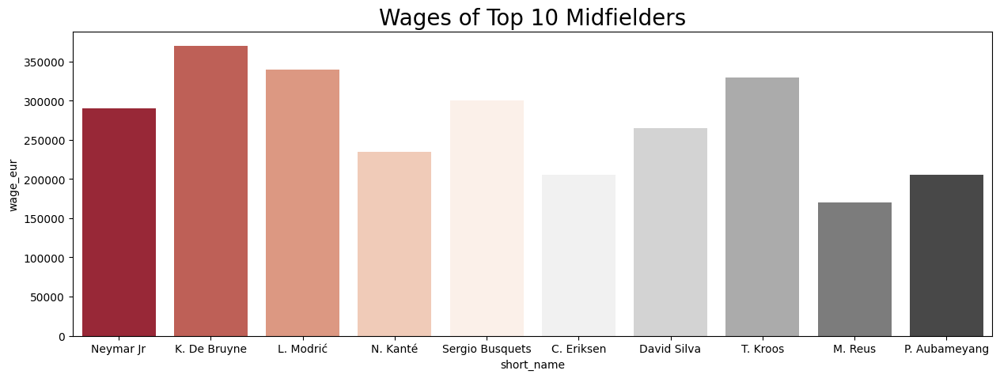

In [92]:
sns.barplot(
    x='short_name',
    y='wage_eur',
    data=df_20_top_midfield.head(10),
    palette="RdGy"
)

# Set the plot title
plt.title("Wages of Top 10 Midfielders", fontsize=20)

# Show the plot
plt.show()

In [94]:
df_20_top_defend = df_20[df_20['team_position'].str.contains('CB|LB|RB|LWB|RWB', na=False)].sort_values(by="overall", ascending=False)
df_20_top_defend.head(10)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
7,203376,https://sofifa.com/player/203376/virgil-van-di...,V. van Dijk,Virgil van Dijk,27,1991-07-08,193,92,Netherlands,Liverpool,90,91,78000000,200000,CB,Right,3,3,2,Medium/Medium,Normal,Yes,2e+08,"#Tackling , #Tactician , #Strength, #Complete ...",LCB,4,NaN,2018-01-01,2023,LCB,4,77,60,70,71,90,86,NaN,NaN,NaN,NaN,NaN,NaN,"Diver, Avoids Using Weaker Foot, Leadership, L...",53,52,86,78,45,70,60,70,81,76,74,79,61,88,53,81,90,75,92,64,82,89,47,65,62,89,91,92,85,13,10,13,11,11,69+3,69+3,69+3,67+3,69+3,69+3,69+3,67+3,69+3,69+3,69+3,69+3,74+3,74+3,74+3,69+3,79+3,83+3,83+3,83+3,79+3,81+3,87+3,87+3,87+3,81+3,24
16,138956,https://sofifa.com/player/138956/giorgio-chiel...,G. Chiellini,Giorgio Chiellini,34,1984-08-14,187,85,Italy,Juventus,89,89,24500000,215000,CB,Left,4,3,2,Medium/High,Normal,Yes,4e+07,"#Tackling , #Tactician , #Strength, #Complete ...",LCB,3,NaN,2005-07-01,2020,LCB,3,68,46,58,60,90,82,NaN,NaN,NaN,NaN,NaN,NaN,"Inflexible, Power Free-Kick, Injury Prone, Lon...",54,33,83,65,45,59,60,31,65,61,61,73,57,82,57,78,89,59,89,49,91,88,28,50,50,84,94,91,89,3,3,2,4,3,58+3,58+3,58+3,55+3,56+3,56+3,56+3,55+3,56+3,56+3,56+3,57+3,62+3,62+3,62+3,57+3,73+3,77+3,77+3,77+3,73+3,76+3,86+3,86+3,86+3,76+3,24
18,155862,https://sofifa.com/player/155862/sergio-ramos-...,Sergio Ramos,Sergio Ramos García,33,1986-03-30,184,82,Spain,Real Madrid,89,89,31500000,300000,CB,Right,4,3,3,High/Medium,Normal,Yes,6e+07,"#Aerial Threat, #Tackling , #Tactician , #Comp...",LCB,4,NaN,2005-08-01,2020,RCB,15,72,68,75,73,87,85,NaN,NaN,NaN,NaN,NaN,NaN,"Injury Prone, Avoids Using Weaker Foot, Leader...",66,63,92,80,69,65,74,72,83,83,74,71,78,87,66,79,93,80,85,62,90,88,67,71,86,84,85,87,90,11,8,9,7,11,74+3,74+3,74+3,72+3,73+3,73+3,73+3,72+3,74+3,74+3,74+3,73+3,78+3,78+3,78+3,73+3,80+3,84+3,84+3,84+3,80+3,82+3,87+3,87+3,87+3,82+3,24
11,201024,https://sofifa.com/player/201024/kalidou-kouli...,K. Koulibaly,Kalidou Koulibaly,28,1991-06-20,187,89,Senegal,Napoli,89,91,67500000,150000,CB,Right,3,3,2,Medium/High,Normal,Yes,1e+08,"#Tackling , #Tactician , #Strength, #Complete ...",LCB,26,NaN,2014-07-01,2021,NaN,NaN,71,28,54,67,89,87,NaN,NaN,NaN,NaN,NaN,NaN,Long Passer (CPU AI Only),30,22,83,71,14,69,28,28,63,71,69,73,52,86,41,55,81,73,95,15,87,88,35,52,33,82,91,90,87,7,11,7,13,5,56+3,56+3,56+3,55+3,57+3,57+3,57+3,55+3,58+3,58+3,58+3,60+3,65+3,65+3,65+3,60+3,74+3,79+3,79+3,79+3,74+3,77+3,86+3,86+3,86+3,77+3,25
29,152729,https://sofifa.com/player/152729/gerard-pique-...,Piqué,Gerard Piqué Bernabéu,32,1987-02-02,194,85,Spain,FC Barcelona,88,88,38000000,285000,CB,Right,4,3,2,High/Medium,Normal,Yes,8e+07,"#Aerial Threat, #Tackling , #Tactician , #Stre...",RCB,3,NaN,2008-07-01,2022,NaN,NaN,56,61,72,68,88,80,NaN,NaN,NaN,NaN,NaN,NaN,Avoids Using 

<ipython-input-95-c1b6c6cfb93a>:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




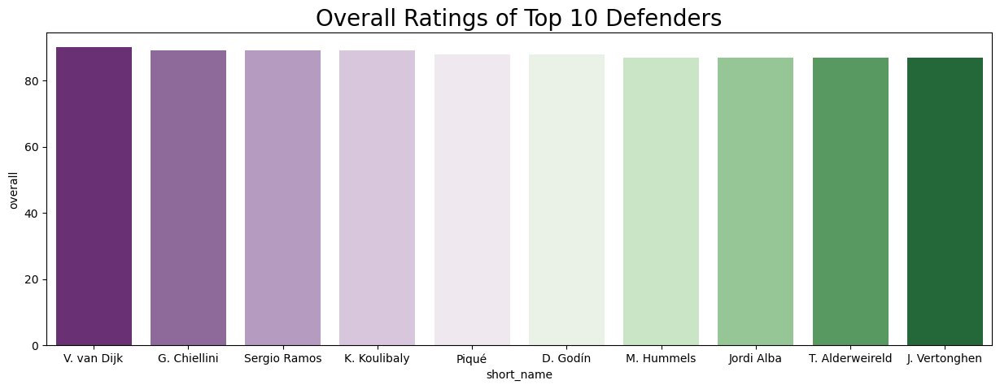

In [95]:
sns.barplot(
    x='short_name',
    y='overall',
    data=df_20_top_defend.head(10),
    palette="PRGn"
)

# Set the plot title
plt.title("Overall Ratings of Top 10 Defenders", fontsize=20)

# Show the plot
plt.show()

<ipython-input-96-6095cdc85c87>:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




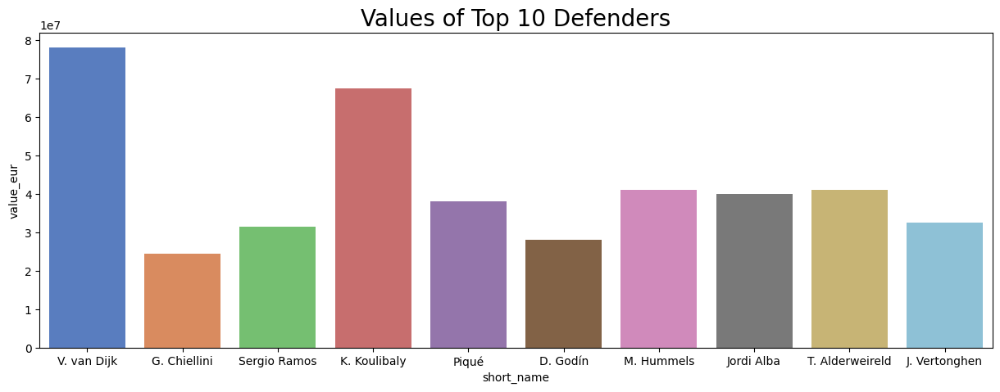

In [96]:
sns.barplot(
    x='short_name',
    y='value_eur',
    data=df_20_top_defend.head(10),
    palette="muted"
)

# Set the plot title
plt.title("Values of Top 10 Defenders", fontsize=20)

# Show the plot
plt.show()

In [97]:
df_20.preferred_foot.value_counts()

,count
preferred_foot,
Right,13960
Left,4318


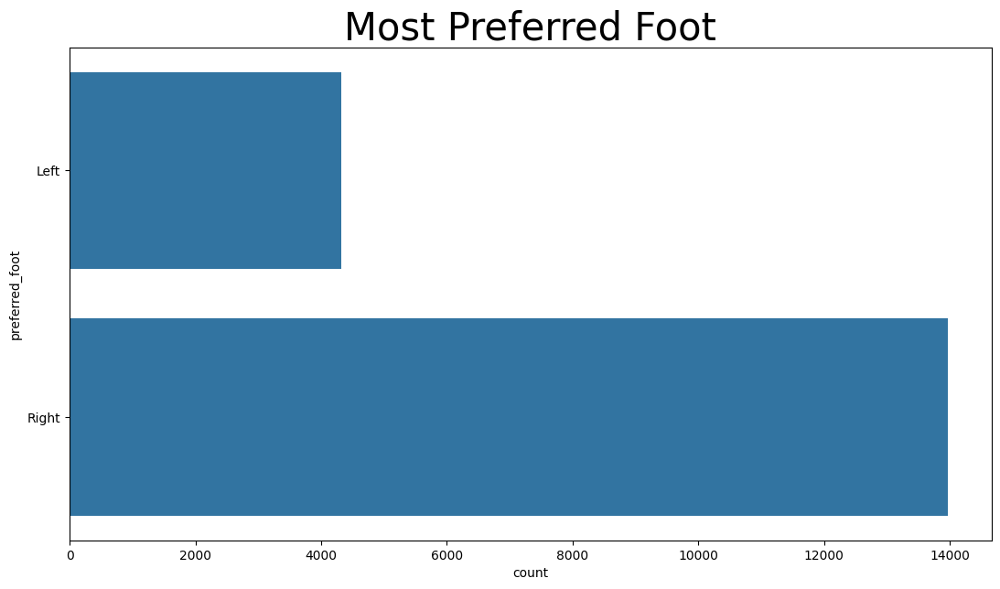

In [98]:
plt.rcParams['figure.figsize']=(13, 7)
sns.countplot(df_20['preferred_foot'])
plt.title("Most Preferred Foot", fontsize=30)
plt.show()


In [99]:
foot = ['Left', 'Right']
data = df_20.query('preferred_foot in @foot')
fig = px.pie(data, names='preferred_foot',
             color_discrete_sequence=px.colors.sequential.Bluered,
             title='Overall Preferred foot percentages')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

In [100]:
df_20_high_value[df_20_high_value['preferred_foot']=='Right'].head(10)


,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,2e+08,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10,NaN,2017-08-03,2022,LW,10,91,85,87,95,32,58,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,22
10,231747,https://sofifa.com/player/231747/kylian-mbappe...,K. Mbappé,Kylian Mbappé,20,1998-12-20,178,73,France,Paris Saint-Germain,89,95,93500000,155000,"ST, RW",Right,3,4,5,High/Low,Normal,Yes,2e+08,"#Speedster, #Dribbler, #Acrobat",RW,7,NaN,2018-07-01,2022,RM,10,96,84,78,90,39,75,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Selfish, Early Crosser, Spe...",78,89,77,82,79,91,79,63,70,90,96,96,92,89,83,83,76,84,76,79,62,38,89,80,70,84,34,34,32,13,5,7,11,6,86+3,86+3,86+3,87+3,87+3,87+3,87+3,87+3,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,66+3,62+3,62+3,62+3,66+3,63+3,54+3,54+3,54+3,63+3,23
5,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,28,1991-06-28,181,70,Belgium,Manchester City,91,91,90000000,370000,"CAM, CM",Right,4,5,4,High/High,Normal,Yes,2e+08,"#Dribbler, #Playmaker , #Engine, #Distance Sh...",RCM,17,NaN,2015-08-30,2023,RCM,7,76,86,92,86,61,78,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Avoids Using Weaker Foot, Div...",93,82,55,92,82,86,85,83,91,91,77,76,78,91,76,91,63,89,74,90,76,61,88,94,79,91,68,58,51,15,13,5,10,13,82+3,82+3,82+3,87+3,87+3,87+3,87+3,87+3,88+3,88+3,88+3,88+3,87+3,87+3,87+3,88+3,77+3,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3,21
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,2e+08,"#Speedster, #Dribbler, #Acrobat",LW,7,NaN,2019-07-01,2024,LF,10,91,83,86,94,35,66,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Selfish, Finesse Shot, Spee...",81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,83+3,83+3,83+3,89+3,88+3,88+3,88+3,89+3,89+3,89+3,89+3,89+3,83+3,83+3,83+3,89+3,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3,24
12,202126,https://sofifa.com/player/202126/harry-kane/20...,H. Kane,Harry Kane,25,1993-07-28,188,89,England,Tottenham Hotspur,89,91,83000000,220000,ST,Right,3,4,3,High/High,Normal,Yes,2e+08,"#Engine, #Distance Shooter, #Clinical Finisher",ST,10,NaN,2010-07-01,2024,ST,9,70,91,79,81,47,83,NaN,NaN,NaN,NaN,NaN,Na

In [101]:
df_20_high_value[df_20_high_value['preferred_foot']=='Left'].head(10)


,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,2e+08,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10,NaN,2004-07-01,2021,NaN,NaN,87,92,92,96,39,66,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24
9,209331,https://sofifa.com/player/209331/mohamed-salah...,M. Salah,Mohamed Salah Ghaly,27,1992-06-15,175,71,Egypt,Liverpool,90,90,80500000,240000,"RW, ST",Left,3,3,4,High/Medium,PLAYER_BODY_TYPE_25,Yes,1e+08,"#Speedster, #Dribbler, #Acrobat, #Clinical Fin...",RW,11,NaN,2017-07-01,2023,RW,10,93,86,81,89,45,74,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",79,90,59,84,79,89,83,69,75,89,94,92,91,92,88,80,69,85,73,84,63,55,92,84,77,91,38,43,41,14,14,9,11,14,84+3,84+3,84+3,88+3,88+3,88+3,88+3,88+3,87+3,87+3,87+3,87+3,81+3,81+3,81+3,87+3,70+3,67+3,67+3,67+3,70+3,66+3,57+3,57+3,57+3,66+3,23
23,211110,https://sofifa.com/player/211110/paulo-dybala/...,P. Dybala,Paulo Bruno Exequiel Dybala,25,1993-11-15,177,75,Argentina,Juventus,88,92,76500000,215000,"CAM, RW",Left,3,3,4,Medium/Medium,Normal,Yes,1e+08,"#Dribbler, #Playmaker , #FK Specialist, #Acro...",RW,10,NaN,2015-07-01,2022,CF,21,83,82,84,90,43,64,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Selfish, Finesse Shot, Spee...",82,80,64,87,88,90,88,88,75,93,86,81,91,84,85,80,75,79,61,86,48,42,80,87,86,84,32,48,40,5,4,4,5,8,80+3,80+3,80+3,85+3,85+3,85+3,85+3,85+3,86+3,86+3,86+3,85+3,80+3,80+3,80+3,85+3,68+3,64+3,64+3,64+3,68+3,64+3,54+3,54+3,54+3,64+3,23
22,194765,https://sofifa.com/player/194765/antoine-griez...,A. Griezmann,Antoine Griezmann,28,1991-03-21,176,73,France,FC Barcelona,89,89,69000000,370000,"CF, ST, LW",Left,4,3,4,High/High,Normal,Yes,1e+08,"#Dribbler, #Engine, #Acrobat, #Clinical Finish...",LW,17,NaN,2019-07-12,2024,CAM,7,81,86,84,89,57,72,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Selfish, Argues with Offici...",83,89,84,85,87,88,86,85,82,90,82,81,90,92,83,82,89,87,63,83,73,49,90,86,86,89,59,54,49,14,8,14,13,14,85+3,85+3,85+3,87+3,87+3,87+3,87+3,87+3,87+3,87+3,87+3,86+3,83+3,83+3,83+3,86+3,73+3,71+3,71+3,71+3,73+3,70+3,65+3,65+3,65+3,70+3,23
41,218667,https://sofifa.com/player/218667/bernardo-mota...,Bernardo Silva,Bernardo Mota Veiga de Carvalho e Silva,24,1994-08-10,173,64,Portugal,Manchester City,87,90,64000000,210000,"RW, CAM, CM",Left,2,3,4,High/High,Lean,Yes,1e+08,"#Dribbler, #Eng

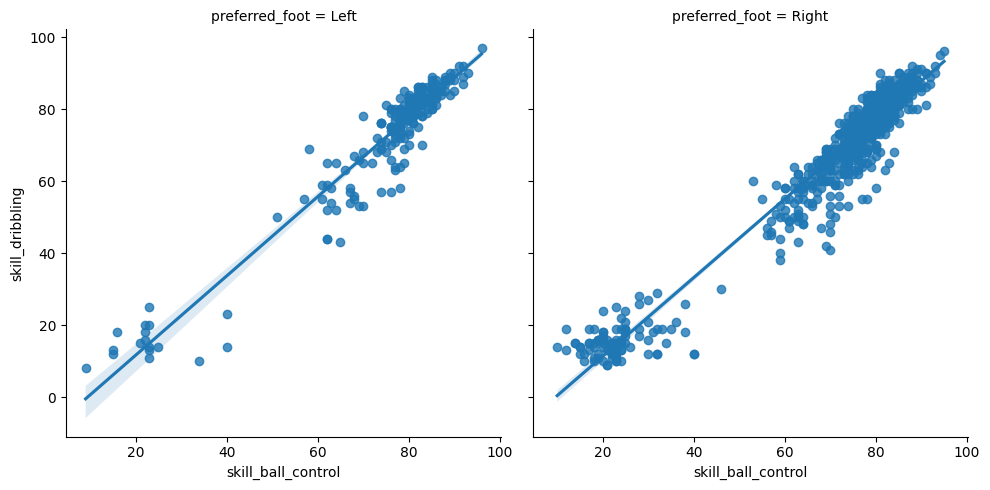

In [102]:
sns.lmplot(x='skill_ball_control', y='skill_dribbling', data=df_20[:1000], col='preferred_foot')

In [103]:
df_20['potential'].mean()


71.5468869679396

In [104]:
young_talent = df_20[df_20['age']<=22]
young_talent.sort_values(by=["potential"], ascending=False).head(10)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
10,231747,https://sofifa.com/player/231747/kylian-mbappe...,K. Mbappé,Kylian Mbappé,20,1998-12-20,178,73,France,Paris Saint-Germain,89,95,93500000,155000,"ST, RW",Right,3,4,5,High/Low,Normal,Yes,2e+08,"#Speedster, #Dribbler, #Acrobat",RW,7,NaN,2018-07-01,2022,RM,10,96,84,78,90,39,75,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Selfish, Early Crosser, Spe...",78,89,77,82,79,91,79,63,70,90,96,96,92,89,83,83,76,84,76,79,62,38,89,80,70,84,34,34,32,13,5,7,11,6,86+3,86+3,86+3,87+3,87+3,87+3,87+3,87+3,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,66+3,62+3,62+3,62+3,66+3,63+3,54+3,54+3,54+3,63+3,23
411,242444,https://sofifa.com/player/242444/joao-felix-se...,João Félix,João Félix Sequeira,19,1999-11-10,181,70,Portugal,Atlético Madrid,80,93,28000000,38000,"CF, ST",Right,1,4,5,High/Medium,Lean,No,7e+07,NaN,RS,7,NaN,2019-07-03,2026,RS,23,82,80,74,81,40,70,NaN,NaN,NaN,NaN,NaN,NaN,"Selfish, Finesse Shot, Speed Dribbler (CPU AI ...",73,79,69,76,79,82,81,58,67,80,79,85,83,83,80,82,79,79,64,80,69,38,84,77,68,82,30,42,35,13,12,14,13,14,79+2,79+2,79+2,79+2,80+2,80+2,80+2,79+2,79+2,79+2,79+2,78+2,73+2,73+2,73+2,78+2,62+2,59+2,59+2,59+2,62+2,59+2,53+2,53+2,53+2,59+2,21
73,235243,https://sofifa.com/player/235243/matthijs-de-l...,M. de Ligt,Matthijs de Ligt,19,1999-08-12,189,89,Netherlands,Juventus,85,93,50000000,76000,CB,Right,3,4,2,Medium/High,Normal,Yes,9e+07,#Strength,SUB,4,NaN,2019-07-18,2024,RCB,3,67,58,66,68,83,84,NaN,NaN,NaN,NaN,NaN,NaN,"Diver, Avoids Using Weaker Foot, Long Passer (...",52,50,85,76,40,66,48,55,74,74,61,72,56,83,60,82,84,77,88,64,82,82,44,63,40,82,86,82,80,12,11,11,12,10,67+3,67+3,67+3,63+3,65+3,65+3,65+3,63+3,66+3,66+3,66+3,65+3,71+3,71+3,71+3,65+3,74+3,79+3,79+3,79+3,74+3,76+3,82+3,82+3,82+3,76+3,24
108,233049,https://sofifa.com/player/233049/jadon-sancho/...,J. Sancho,Jadon Sancho,19,2000-03-25,180,76,England,Borussia Dortmund,84,92,44500000,61000,"RM, LM",Right,2,4,5,Medium/Low,Lean,Yes,8e+07,"#Dribbler, #Acrobat",RM,7,NaN,2017-08-31,2022,RW,21,88,72,77,90,36,60,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Selfish, Speed Dribbler (CP...",78,78,37,83,80,92,81,48,59,88,89,87,91,84,90,68,51,77,59,62,43,29,78,83,57,80,32,45,34,7,11,10,11,13,75+2,75+2,75+2,83+2,81+2,81+2,81+2,83+2,82+2,82+2,82+2,83+2,75+2,75+2,75+2,83+2,64+2,58+2,58+2,58+2,64+2,59+2,47+2,47+2,47+2,59+2,23
109,235790,https://sofifa.com/player/235790/kai-havertz/2...,K. Havertz,Kai Havertz,20,1999-06-11,188,83,Germany,Bayer 04 Leverkusen,84,92,46000000,70000,"CAM, RM",Left,1,4,4,Medium/Medium,Lean,Yes,9e+07,NaN,RF,29,NaN,2016-07-01,2022,SUB,23,84,78,79,84,44,65,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Leadership, Argues with Off...",73,81,74,85,80,84,79,53,78,87,77,89,78,82,73,73,69,82,65,75,41,38,83,82,69,84,39,46,38,6,8,1

In [105]:
most_valuable_young = young_talent.sort_values(by=["overall"], ascending=False)
most_valuable_young.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
10,231747,https://sofifa.com/player/231747/kylian-mbappe...,K. Mbappé,Kylian Mbappé,20,1998-12-20,178,73,France,Paris Saint-Germain,89,95,93500000,155000,"ST, RW",Right,3,4,5,High/Low,Normal,Yes,2e+08,"#Speedster, #Dribbler, #Acrobat",RW,7,NaN,2018-07-01,2022,RM,10,96,84,78,90,39,75,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Selfish, Early Crosser, Spe...",78,89,77,82,79,91,79,63,70,90,96,96,92,89,83,83,76,84,76,79,62,38,89,80,70,84,34,34,32,13,5,7,11,6,86+3,86+3,86+3,87+3,87+3,87+3,87+3,87+3,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,66+3,62+3,62+3,62+3,66+3,63+3,54+3,54+3,54+3,63+3,23
74,230621,https://sofifa.com/player/230621/gianluigi-don...,G. Donnarumma,Gianluigi Donnarumma,20,1999-02-25,196,90,Italy,Milan,85,92,41500000,34000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,8e+07,NaN,GK,99,NaN,2015-07-01,2021,GK,22,NaN,NaN,NaN,NaN,NaN,NaN,90,80,74,90,50,80,"Swerve Pass, Acrobatic Clearance",12,12,12,34,8,28,12,14,24,28,46,54,64,79,38,56,72,34,72,18,30,26,14,50,24,68,20,14,16,90,80,74,80,90,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23
75,228702,https://sofifa.com/player/228702/frenkie-de-jo...,F. de Jong,Frenkie de Jong,22,1997-05-12,180,74,Netherlands,FC Barcelona,85,91,52000000,195000,"CM, CDM",Right,3,3,4,Medium/High,Lean,No,1e+08,"#Dribbler, #Playmaker , #Complete Midfielder",LCM,21,NaN,2019-07-01,2024,LDM,21,79,64,84,87,76,76,NaN,NaN,NaN,NaN,NaN,NaN,"Selfish, Finesse Shot, Speed Dribbler (CPU AI ...",75,64,66,90,69,88,84,64,86,89,80,78,84,87,79,68,76,82,74,62,72,81,70,86,45,90,75,75,77,7,13,10,10,9,74+3,74+3,74+3,80+3,79+3,79+3,79+3,80+3,82+3,82+3,82+3,82+3,83+3,83+3,83+3,82+3,81+3,82+3,82+3,82+3,81+3,79+3,76+3,76+3,76+3,79+3,22
73,235243,https://sofifa.com/player/235243/matthijs-de-l...,M. de Ligt,Matthijs de Ligt,19,1999-08-12,189,89,Netherlands,Juventus,85,93,50000000,76000,CB,Right,3,4,2,Medium/High,Normal,Yes,9e+07,#Strength,SUB,4,NaN,2019-07-18,2024,RCB,3,67,58,66,68,83,84,NaN,NaN,NaN,NaN,NaN,NaN,"Diver, Avoids Using Weaker Foot, Long Passer (...",52,50,85,76,40,66,48,55,74,74,61,72,56,83,60,82,84,77,88,64,82,82,44,63,40,82,86,82,80,12,11,11,12,10,67+3,67+3,67+3,63+3,65+3,65+3,65+3,63+3,66+3,66+3,66+3,65+3,71+3,71+3,71+3,65+3,74+3,79+3,79+3,79+3,74+3,76+3,82+3,82+3,82+3,76+3,24
108,233049,https://sofifa.com/player/233049/jadon-sancho/...,J. Sancho,Jadon Sancho,19,2000-03-25,180,76,England,Borussia Dortmund,84,92,44500000,61000,"RM, LM",Right,2,4,5,Medium/Low,Lean,Yes,8e+07,"#Dribbler, #Acrobat",RM,7,NaN,2017-08-31,2022,RW,21,88,72,77,90,36,60,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Selfish, Speed Dribbler (CP...",78,78,37,83,80,92,81,48,59,88,89,87,91,84,90,68,51,77,59,62,43,29,78,83,57,80,32,45,34,7,11,10,11,13,75+

In [ ]:
print(most_valuable_young['age'][:10].mean())
print(most_valuable_young['value_eur'][:10].mean())

20.5
47950000.0


In [106]:
young_talent.sort_values(by=["release_clause_eur"], ascending=False).head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
10,231747,https://sofifa.com/player/231747/kylian-mbappe...,K. Mbappé,Kylian Mbappé,20,1998-12-20,178,73,France,Paris Saint-Germain,89,95,93500000,155000,"ST, RW",Right,3,4,5,High/Low,Normal,Yes,2e+08,"#Speedster, #Dribbler, #Acrobat",RW,7,NaN,2018-07-01,2022,RM,10,96,84,78,90,39,75,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Selfish, Early Crosser, Spe...",78,89,77,82,79,91,79,63,70,90,96,96,92,89,83,83,76,84,76,79,62,38,89,80,70,84,34,34,32,13,5,7,11,6,86+3,86+3,86+3,87+3,87+3,87+3,87+3,87+3,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,66+3,62+3,62+3,62+3,66+3,63+3,54+3,54+3,54+3,63+3,23
75,228702,https://sofifa.com/player/228702/frenkie-de-jo...,F. de Jong,Frenkie de Jong,22,1997-05-12,180,74,Netherlands,FC Barcelona,85,91,52000000,195000,"CM, CDM",Right,3,3,4,Medium/High,Lean,No,1e+08,"#Dribbler, #Playmaker , #Complete Midfielder",LCM,21,NaN,2019-07-01,2024,LDM,21,79,64,84,87,76,76,NaN,NaN,NaN,NaN,NaN,NaN,"Selfish, Finesse Shot, Speed Dribbler (CPU AI ...",75,64,66,90,69,88,84,64,86,89,80,78,84,87,79,68,76,82,74,62,72,81,70,86,45,90,75,75,77,7,13,10,10,9,74+3,74+3,74+3,80+3,79+3,79+3,79+3,80+3,82+3,82+3,82+3,82+3,83+3,83+3,83+3,82+3,81+3,82+3,82+3,82+3,81+3,79+3,76+3,76+3,76+3,79+3,22
110,231443,https://sofifa.com/player/231443/ousmane-dembe...,O. Dembélé,Ousmane Dembélé,22,1997-05-15,178,67,France,FC Barcelona,84,90,42500000,195000,"RW, LW",Left,3,5,5,High/Medium,Lean,Yes,1e+08,"#Speedster, #Dribbler",SUB,11,NaN,2017-08-28,2022,SUB,11,93,79,80,87,36,57,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Selfish, Early Crosser, Crowd...",84,79,43,82,76,89,82,64,76,85,94,93,89,78,83,83,59,69,52,78,54,36,78,78,75,82,42,30,33,6,6,14,10,13,76+3,76+3,76+3,84+3,82+3,82+3,82+3,84+3,82+3,82+3,82+3,83+3,75+3,75+3,75+3,83+3,64+3,59+3,59+3,59+3,64+3,59+3,47+3,47+3,47+3,59+3,21
73,235243,https://sofifa.com/player/235243/matthijs-de-l...,M. de Ligt,Matthijs de Ligt,19,1999-08-12,189,89,Netherlands,Juventus,85,93,50000000,76000,CB,Right,3,4,2,Medium/High,Normal,Yes,9e+07,#Strength,SUB,4,NaN,2019-07-18,2024,RCB,3,67,58,66,68,83,84,NaN,NaN,NaN,NaN,NaN,NaN,"Diver, Avoids Using Weaker Foot, Long Passer (...",52,50,85,76,40,66,48,55,74,74,61,72,56,83,60,82,84,77,88,64,82,82,44,63,40,82,86,82,80,12,11,11,12,10,67+3,67+3,67+3,63+3,65+3,65+3,65+3,63+3,66+3,66+3,66+3,65+3,71+3,71+3,71+3,65+3,74+3,79+3,79+3,79+3,74+3,76+3,82+3,82+3,82+3,76+3,24
109,235790,https://sofifa.com/player/235790/kai-havertz/2...,K. Havertz,Kai Havertz,20,1999-06-11,188,83,Germany,Bayer 04 Leverkusen,84,92,46000000,70000,"CAM, RM",Left,1,4,4,Medium/Medium,Lean,Yes,9e+07,NaN,RF,29,NaN,2016-07-01,2022,SUB,23,84,78,79,84,44,65,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Leadership, Argues with Off...",73,81,74,85,80,84,79,53,78,87,77,89,78,82,73,73,

In [107]:
# Create a copy of the original DataFrame
df_copy = df_20.copy()

# Initialize a new column for potential value
df_copy['potential_value'] = None

# Loop through the range of overall ratings
for p in range(80, 95):
    # Calculate the mean value for players with the current overall rating
    mean_value = round(df_copy.loc[df_copy['overall'] == p, 'value_eur'].mean())

    # Update the potential_value for players with the current potential rating
    df_copy.loc[df_copy['potential'] == p, 'potential_value'] = mean_value

# Calculate the value change
df_copy['value_change'] = df_copy['potential_value'] - df_copy['value_eur']

# Select and sort the relevant columns, then display the top 20 by value change
result = df_copy.loc[:, ['short_name', 'age', 'overall', 'potential', 'value_eur', 'potential_value', 'value_change']].sort_values(by="value_change", ascending=False).head(20)

# Display the result
print(result)

          short_name  age  overall  potential  value_eur potential_value  \
568     Vinícius Jr.   18       79         92   22500000       105500000   
74     G. Donnarumma   20       85         92   41500000       105500000   
108        J. Sancho   19       84         92   44500000       105500000   
109       K. Havertz   20       84         92   46000000       105500000   
1254        P. Foden   19       76         90   16500000        67750000   
2121   D. Szoboszlai   18       74         89   11500000        60115385   
4756   P. De la Vega   18       70         88    3700000        51029412   
1615       S. Tonali   19       75         89   13500000        60115385   
4041       W. Saliba   18       71         88    4600000        51029412   
753         A. Meret   22       78         89   14000000        60115385   
1256         Rodrygo   18       76         89   14000000        60115385   
1255         M. Kean   19       76         89   14500000        60115385   
12158      E

In [108]:
corr_mat = df_20.corr(numeric_only=True)

# Display the correlation matrix
print(corr_mat)

                         sofifa_id    age  height_cm  weight_kg  overall  \
sofifa_id                    1e+00 -7e-01     -9e-02     -2e-01   -4e-01   
age                         -7e-01  1e+00      8e-02      2e-01    5e-01   
height_cm                   -9e-02  8e-02      1e+00      8e-01    4e-02   
weight_kg                   -2e-01  2e-01      8e-01      1e+00    2e-01   
overall                     -4e-01  5e-01      4e-02      2e-01    1e+00   
...                            ...    ...        ...        ...      ...   
goalkeeping_handling        -1e-01  1e-01      4e-01      3e-01   -1e-02   
goalkeeping_kicking         -1e-01  1e-01      4e-01      3e-01   -2e-02   
goalkeeping_positioning     -1e-01  1e-01      4e-01      3e-01   -6e-03   
goalkeeping_reflexes        -1e-01  1e-01      4e-01      3e-01   -1e-02   
bmi                         -2e-01  3e-01     -4e-02      6e-01    2e-01   

                         potential  value_eur  wage_eur  \
sofifa_id                   

In [ ]:
corr_mat.loc['age':'wage_eur', 'age':'wage_eur']


,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur
age,1e+00,8e-02,2e-01,5e-01,-3e-01,8e-02,2e-01
height_cm,8e-02,1e+00,8e-01,4e-02,-2e-03,1e-02,2e-02
weight_kg,2e-01,8e-01,1e+00,2e-01,-1e-02,5e-02,7e-02
overall,5e-01,4e-02,2e-01,1e+00,6e-01,6e-01,6e-01
potential,-3e-01,-2e-03,-1e-02,6e-01,1e+00,6e-01,5e-01
value_eur,8e-02,1e-02,5e-02,6e-01,6e-01,1e+00,9e-01
wage_eur,2e-01,2e-02,7e-02,6e-01,5e-01,9e-01,1e+00


<Axes: >

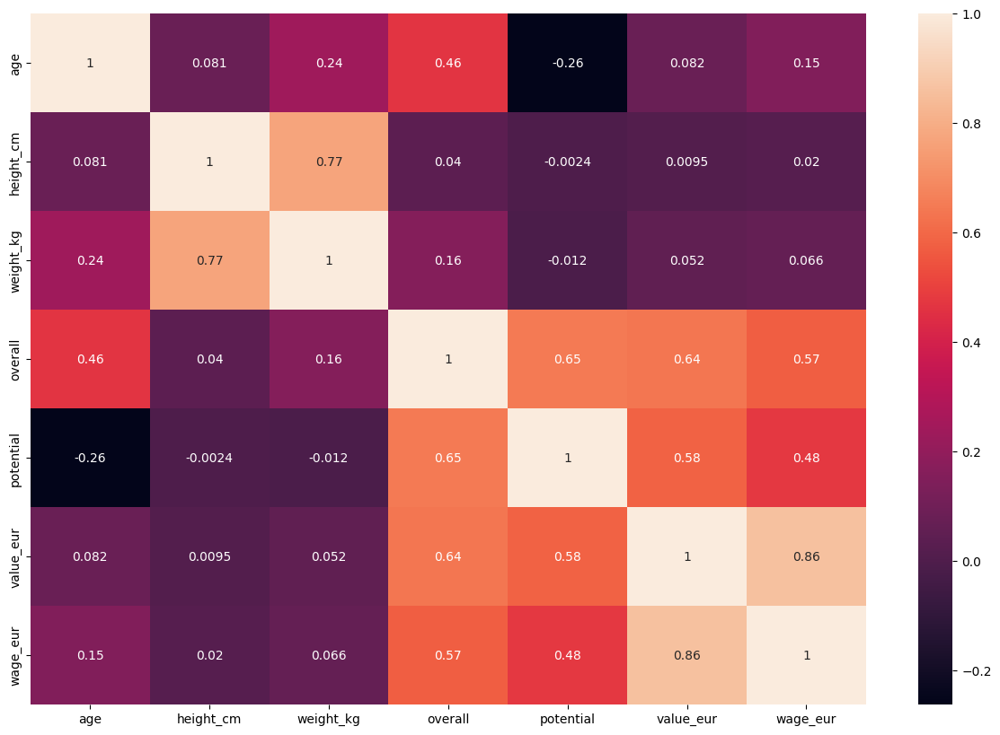

In [109]:
plt.figure(figsize=(15,10))
sns.heatmap(corr_mat.loc['age':'wage_eur', 'age':'wage_eur'], annot=True, cbar=True)

<Axes: >

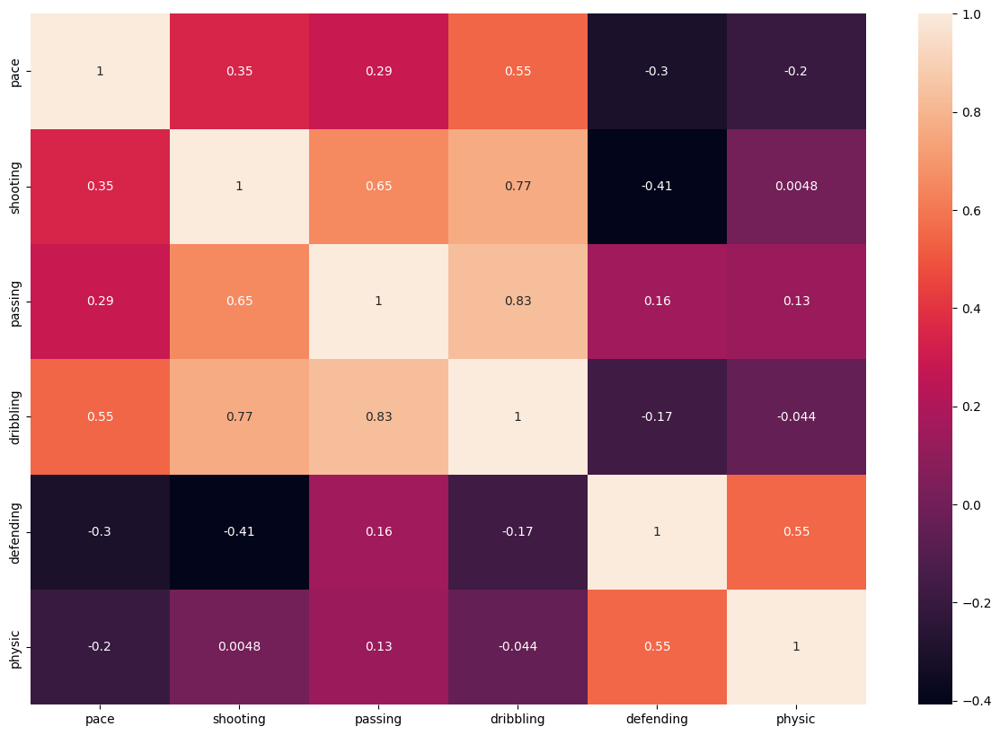

In [110]:
plt.figure(figsize=(15,10))
sns.heatmap(corr_mat.loc['pace':'physic', 'pace':'physic'], annot=True, cbar=True)

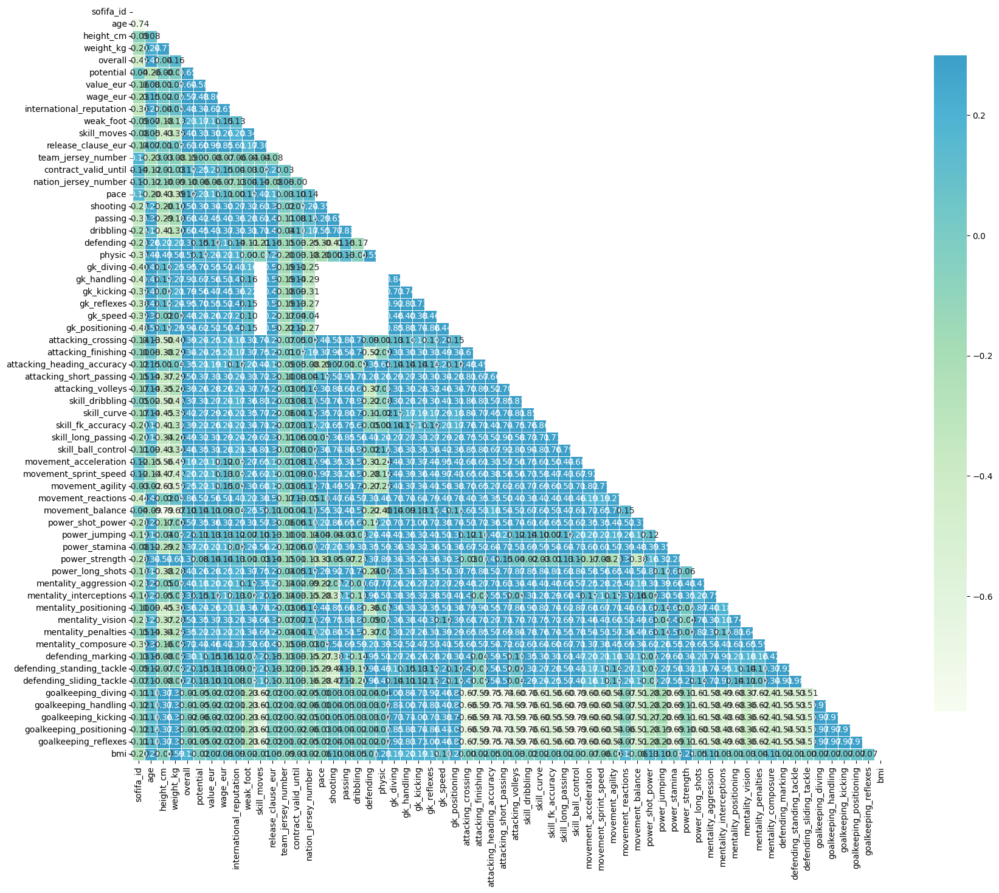

In [113]:
plt.figure(figsize=(20, 20))

# Create a mask for the upper triangle
mask = np.zeros_like(corr_mat, dtype=bool) # Define the mask variable
mask[np.triu_indices_from(mask)] = True

# Create the heatmap
sns.heatmap(corr_mat,
            mask=mask,  # Apply the mask
            cmap="GnBu",
            vmax=.3,
            center=0,
            square=True,
            linewidths=.7,
            cbar_kws={"shrink": .7},
            annot=True,
            fmt=".2f")

# Show the plot
plt.show()

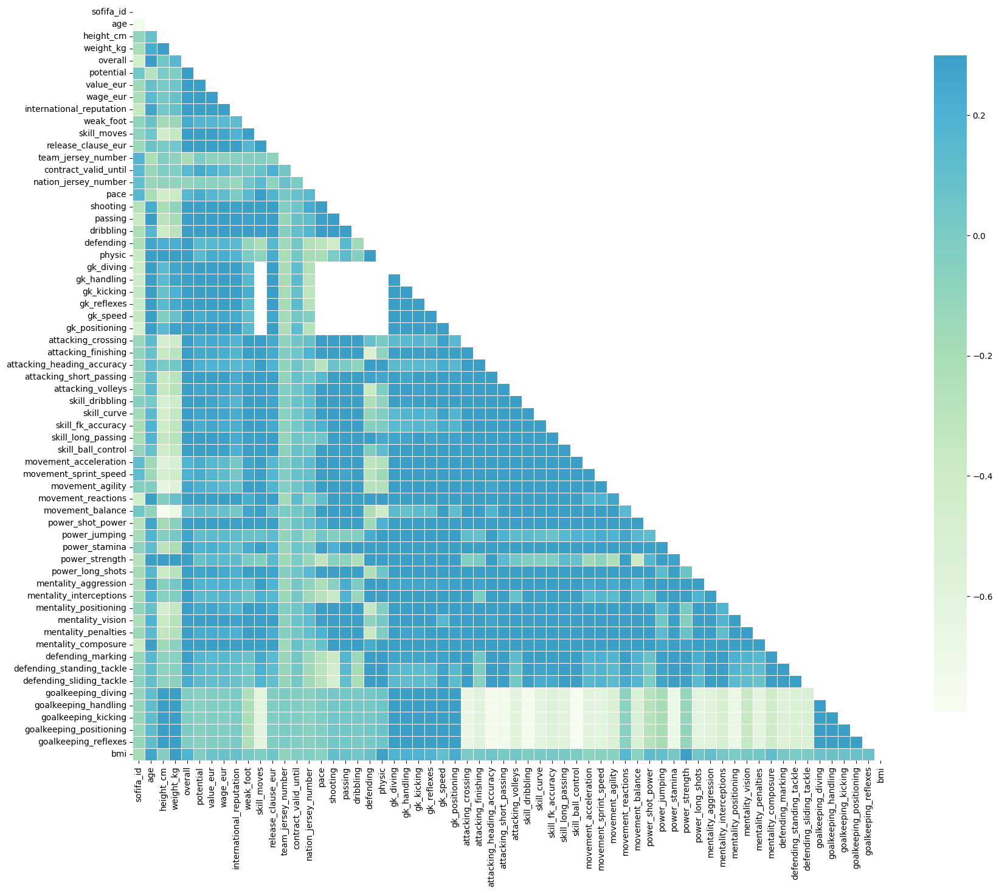

In [114]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming corr_mat is already defined as your correlation matrix
plt.figure(figsize=(20, 20))

# Create a mask for the upper triangle
mask = np.zeros_like(corr_mat, dtype=bool)
mask[np.triu_indices_from(mask)] = True

# Create the heatmap
sns.heatmap(corr_mat,
            mask=mask,
            cmap="GnBu",
            vmax=.3,
            center=0,
            square=True,
            linewidths=.7,
            cbar_kws={"shrink": .7})

# Show the plot
plt.show()

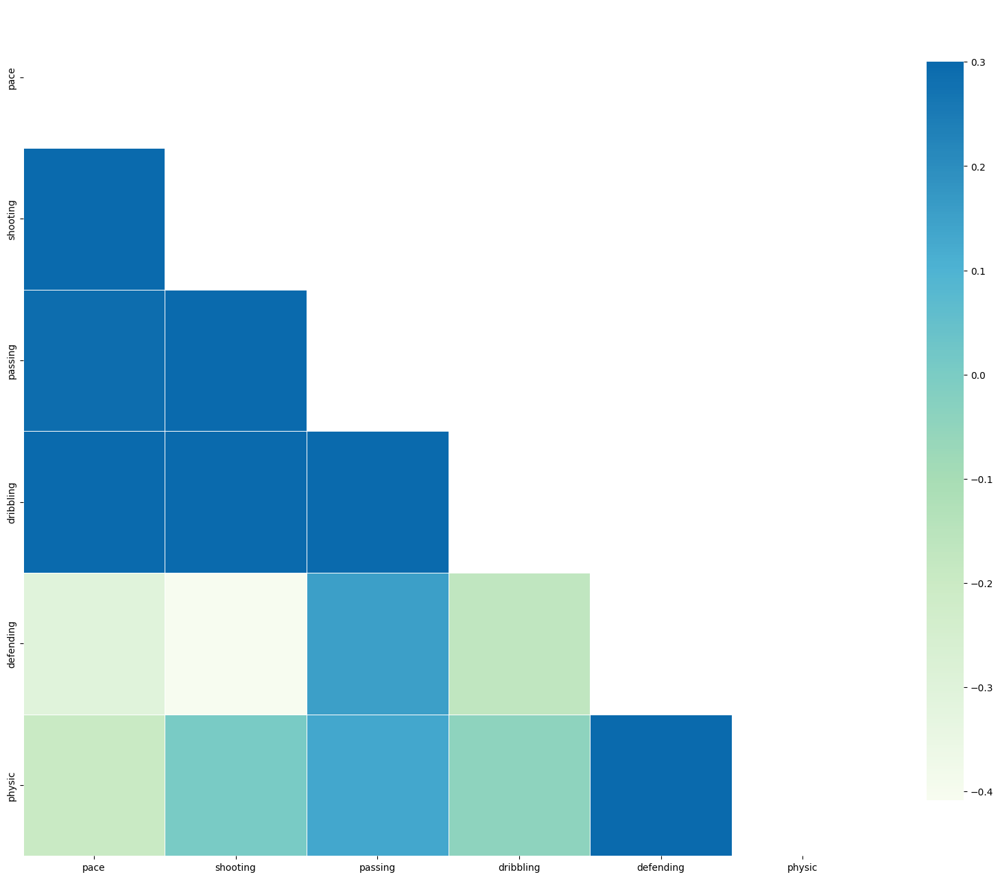

In [115]:


# Assuming corr_mat is already defined as your correlation matrix
plt.figure(figsize=(20, 20))

# Create a mask for the upper triangle of the specified section
mask = np.zeros_like(corr_mat.loc['pace':'physic', 'pace':'physic'], dtype=bool)
mask[np.triu_indices_from(mask)] = True

# Create the heatmap for the specified section with the mask applied
sns.heatmap(corr_mat.loc['pace':'physic', 'pace':'physic'],
            mask=mask,
            cmap="GnBu",
            vmax=.3,
            center=0,
            square=True,
            linewidths=.7,
            cbar_kws={"shrink": .7})

# Show the plot
plt.show()

In [116]:
df_20[df_20["international_reputation"]==5].head(10)


,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,2e+08,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10,NaN,2004-07-01,2021,NaN,NaN,87,92,92,96,39,66,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,1e+08,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7,NaN,2018-07-10,2022,LS,7,90,93,82,89,35,78,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,23
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,2e+08,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10,NaN,2017-08-03,2022,LW,10,91,85,87,95,32,58,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,22
19,176580,https://sofifa.com/player/176580/luis-suarez/2...,L. Suárez,Luis Alberto Suárez Díaz,32,1987-01-24,182,86,Uruguay,FC Barcelona,89,89,53000000,355000,ST,Right,5,4,3,High/Medium,Normal,Yes,1e+08,"#Distance Shooter, #Strength, #Clinical Finish...",ST,9,NaN,2014-07-11,2021,NaN,NaN,73,89,80,84,51,84,NaN,NaN,NaN,NaN,NaN,NaN,"Diver, Speed Dribbler (CPU AI Only)",78,91,83,82,90,85,86,82,72,84,76,70,79,92,79,88,69,82,86,86,87,41,92,82,83,85,57,45,38,27,25,31,33,37,86+5,86+5,86+5,83+5,85+5,85+5,85+5,83+5,84+5,84+5,84+5,82+5,79+5,79+5,79+5,82+5,67+5,67+5,67+5,67+5,67+5,64+5,63+5,63+5,63+5,64+5,25
31,167495,https://sofifa.com/player/167495/manuel-neuer/...,M. Neuer,Manuel Neuer,33,1986-03-27,193,92,Germany,FC Bayern München,88,88,32000000,155000,GK,Right,5,4,1,Medium/Medium,Normal,Yes,5e+07,NaN,GK,1,NaN,2011-07-01,2021,GK,1,NaN,Na

In [117]:
top_speed = df_20.sort_values(by=['movement_sprint_speed'], ascending=False)
free_kick = df_20.sort_values(by=['skill_fk_accuracy'], ascending=False)
skill_moves = df_20.sort_values(by=['skill_moves'], ascending=False)
finishing = df_20.sort_values(by=['attacking_finishing'], ascending=False)

In [119]:
top_speed.head()


,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
10,231747,https://sofifa.com/player/231747/kylian-mbappe...,K. Mbappé,Kylian Mbappé,20,1998-12-20,178,73,France,Paris Saint-Germain,89,95,93500000,155000,"ST, RW",Right,3,4,5,High/Low,Normal,Yes,2e+08,"#Speedster, #Dribbler, #Acrobat",RW,7,NaN,2018-07-01,2022,RM,10,96,84,78,90,39,75,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Selfish, Early Crosser, Spe...",78,89,77,82,79,91,79,63,70,90,96,96,92,89,83,83,76,84,76,79,62,38,89,80,70,84,34,34,32,13,5,7,11,6,86+3,86+3,86+3,87+3,87+3,87+3,87+3,87+3,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,66+3,62+3,62+3,62+3,66+3,63+3,54+3,54+3,54+3,63+3,23
2167,213956,https://sofifa.com/player/213956/adama-traore-...,Adama Traoré,Adama Traoré Diarra,23,1996-01-25,178,72,Spain,Wolverhampton Wanderers,74,82,8500000,56000,"RW, RWB",Right,1,2,4,High/Medium,Stocky,Yes,2e+07,"#Speedster, #Dribbler",SUB,37,NaN,2018-08-08,2023,NaN,NaN,96,60,61,84,31,75,NaN,NaN,NaN,NaN,NaN,NaN,"Injury Prone, Injury Free, Selfish, Early Crosser",71,58,40,64,52,89,65,42,52,80,97,96,84,62,87,74,73,73,81,55,62,29,60,57,47,70,25,36,33,13,9,11,12,7,67+2,67+2,67+2,73+2,70+2,70+2,70+2,73+2,69+2,69+2,69+2,73+2,62+2,62+2,62+2,73+2,58+2,51+2,51+2,51+2,58+2,54+2,46+2,46+2,46+2,54+2,22
9065,236943,https://sofifa.com/player/236943/anibal-chala/...,A. Chalá,Anibal Chalá,23,1996-05-09,178,71,Ecuador,Deportivo Toluca,66,73,800000,5000,"LB, LM",Left,1,3,2,High/Medium,Lean,No,2e+06,#Speedster,LWB,6,NaN,2019-07-01,2022,NaN,NaN,95,46,54,57,63,65,NaN,NaN,NaN,NaN,NaN,NaN,Early Crosser,59,38,56,54,36,54,49,31,51,55,93,96,70,58,66,61,67,75,59,42,68,59,66,58,54,60,67,65,62,6,13,10,8,7,57+2,57+2,57+2,59+2,58+2,58+2,58+2,59+2,57+2,57+2,57+2,61+2,56+2,56+2,56+2,61+2,64+2,59+2,59+2,59+2,64+2,65+2,62+2,62+2,62+2,65+2,22
55,222492,https://sofifa.com/player/222492/leroy-sane/20...,L. Sané,Leroy Sané,23,1996-01-11,183,75,Germany,Manchester City,86,92,61000000,195000,LW,Left,2,3,4,High/Medium,Lean,Yes,1e+08,"#Speedster, #Dribbler, #Acrobat",SUB,19,NaN,2016-08-02,2021,LW,19,95,81,79,86,38,70,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Early Crosser",83,81,72,80,85,88,83,82,64,85,93,96,86,81,80,87,64,78,70,78,61,34,84,82,71,80,36,32,35,8,12,9,9,14,82+2,82+2,82+2,84+2,84+2,84+2,84+2,84+2,83+2,83+2,83+2,83+2,74+2,74+2,74+2,83+2,65+2,59+2,59+2,59+2,65+2,61+2,52+2,52+2,52+2,61+2,22
1083,216258,https://sofifa.com/player/216258/ihlas-bebou/2...,I. Bebou,Ihlas Bebou,25,1994-04-23,183,72,Togo,TSG 1899 Hoffenheim,77,80,11000000,36000,"RW, ST, LW",Right,1,3,4,Medium/Medium,Lean,Yes,2e+07,#Speedster,RS,9,NaN,2019-07-01,2023,NaN,NaN,93,70,66,81,33,64,NaN,NaN,NaN,NaN,NaN,NaN,Early Crosser,68,74,55,73,63,83,63,46,53,78,91,95,83,73,75,66,69,78,64,64,43,31,74,68,67,66,26,35,33,10,11,12,11,11,72+2,72+2,72+2,77+2,75+2,75+2,75+2,77+2

In [118]:
free_kick.head()


,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,2e+08,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10,NaN,2004-07-01,2021,NaN,NaN,87,92,92,96,39,66,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24
393,184431,https://sofifa.com/player/184431/sebastian-gio...,S. Giovinco,Sebastian Giovinco,32,1987-01-26,163,61,Italy,Al Hilal,81,81,14000000,56000,"CF, ST, RM",Right,2,4,4,High/Medium,Normal,Yes,2e+07,"#Dribbler, #FK Specialist, #Acrobat",RS,9,NaN,2019-01-31,2022,NaN,NaN,81,79,79,87,27,56,NaN,NaN,NaN,NaN,NaN,NaN,"Selfish, Argues with Officials, Finesse Shot, ...",72,78,34,80,75,86,90,92,76,86,84,78,94,83,93,80,34,75,42,81,75,26,83,78,73,82,23,29,28,6,3,6,3,3,74+2,74+2,74+2,81+2,81+2,81+2,81+2,81+2,82+2,82+2,82+2,80+2,75+2,75+2,75+2,80+2,59+2,56+2,56+2,56+2,59+2,53+2,41+2,41+2,41+2,53+2,22
65,180206,https://sofifa.com/player/180206/miralem-pjani...,M. Pjanić,Miralem Pjanić,29,1990-04-02,178,72,Bosnia Herzegovina,Juventus,86,86,42500000,180000,"CM, CDM",Right,3,4,3,Medium/Medium,Normal,Yes,7e+07,"#Dribbler, #Playmaker , #FK Specialist, #Comp...",CDM,5,NaN,2016-07-01,2023,NaN,NaN,68,68,87,85,75,67,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Fine...",80,56,60,91,72,86,86,92,87,89,69,67,75,84,81,78,60,79,61,82,70,78,68,88,79,86,78,76,70,7,7,13,7,8,71+3,71+3,71+3,78+3,78+3,78+3,78+3,78+3,81+3,81+3,81+3,80+3,84+3,84+3,84+3,80+3,79+3,80+3,80+3,80+3,79+3,77+3,73+3,73+3,73+3,77+3,22
1612,251691,https://sofifa.com/player/251691/alan-zamorado...,A. Zamorado,Alan Zamorado,38,1980-12-17,182,78,Ecuador,Ecuador,76,76,0,0,LM,Left,2,3,3,Medium/Low,Lean,No,NaN,"#Distance Shooter, #FK Specialist",NaN,NaN,NaN,NaN,NaN,LM,17,57,78,81,77,36,59,NaN,NaN,NaN,NaN,NaN,NaN,"Dives Into Tackles (CPU AI Only), Leadership, ...",80,68,41,80,81,74,86,91,79,85,59,55,72,76,72,86,77,74,58,89,38,55,76,80,86,70,40,26,15,6,11,8,6,10,70+2,70+2,70+2,75+2,75+2,75+2,75+2,75+2,77+2,77+2,77+2,75+2,75+2,75+2,75+2,75+2,59+2,59+2,59+2,59+2,59+2,53+2,45+2,45+2,45+2,53+2,23
779,237239,https://sofifa.com/player/237239/enis-bardhi/2...,E. Bardhi,Enis Bardhi,23,1995-07-02,172,64,FYR Macedonia,Levante UD,78,84,14000000,23000,"CM, LM, CAM",Right,1,4,4,Medium/Medium,Normal,Yes,3e+07,#FK Specialist,LCM,10,NaN,2017-07-17,2022,NaN,NaN,72,81,78,80,63,56,NaN,NaN,NaN,NaN,NaN,NaN,"Argues with Officials, Speed 

In [120]:
skill_moves.head()


,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
256,227055,https://sofifa.com/player/227055/gelson-dany-b...,Gelson Martins,Gelson Dany Batalha Martins,24,1995-05-11,173,74,Portugal,AS Monaco,82,86,29000000,47000,"RM, RW",Right,3,3,5,High/Medium,Lean,No,6e+07,"#Speedster, #Dribbler, #Acrobat",RM,11,NaN,2019-07-01,2024,NaN,NaN,95,71,74,86,47,61,NaN,NaN,NaN,NaN,NaN,NaN,"Selfish, Early Crosser, Speed Dribbler (CPU AI...",80,70,51,76,74,87,82,60,55,81,95,95,95,81,92,72,65,86,48,69,60,43,79,78,66,82,54,46,36,12,9,7,6,9,74+3,74+3,74+3,81+3,79+3,79+3,79+3,81+3,79+3,79+3,79+3,80+3,72+3,72+3,72+3,80+3,68+3,61+3,61+3,61+3,68+3,64+3,53+3,53+3,53+3,64+3,24
568,238794,https://sofifa.com/player/238794/vinicius-jose...,Vinícius Jr.,Vinícius José de Oliveira Júnior,18,2000-07-12,176,73,Brazil,Real Madrid,79,92,22500000,60000,LW,Right,2,4,5,High/Medium,Lean,Yes,6e+07,"#Speedster, #Dribbler, #Acrobat",RW,28,NaN,2018-07-12,2025,NaN,NaN,93,70,71,85,29,63,NaN,NaN,NaN,NaN,NaN,NaN,"Selfish, Early Crosser, Speed Dribbler (CPU AI...",71,68,50,73,70,86,77,62,67,82,92,94,93,77,83,74,75,79,60,68,48,26,76,73,65,77,32,25,18,5,7,7,7,10,73+2,73+2,73+2,79+2,77+2,77+2,77+2,79+2,77+2,77+2,77+2,78+2,70+2,70+2,70+2,78+2,58+2,53+2,53+2,53+2,58+2,53+2,43+2,43+2,43+2,53+2,23
154,204485,https://sofifa.com/player/204485/riyad-mahrez/...,R. Mahrez,Riyad Mahrez,28,1991-02-21,179,67,Algeria,Manchester City,84,84,31500000,195000,"RW, RM",Left,3,4,5,Medium/Medium,Lean,Yes,6e+07,"#Dribbler, #Acrobat",SUB,26,NaN,2018-07-10,2023,NaN,NaN,84,78,79,89,38,59,NaN,NaN,NaN,NaN,NaN,NaN,"Injury Free, Beat Offside Trap, Selfish, Argue...",81,77,48,78,76,90,84,78,75,90,87,82,92,77,87,79,60,76,54,80,48,39,79,81,70,84,45,31,22,15,9,13,11,6,76+3,76+3,76+3,83+3,81+3,81+3,81+3,83+3,82+3,82+3,82+3,82+3,76+3,76+3,76+3,82+3,63+3,59+3,59+3,59+3,63+3,58+3,47+3,47+3,47+3,58+3,20
1931,174549,https://sofifa.com/player/174549/matias-fernan...,M. Fernández,Matías Ariel Fernández Fernández,33,1986-05-15,178,72,Chile,Junior FC,75,75,3900000,5000,"CM, CAM",Right,2,4,5,Medium/Medium,Lean,No,6e+06,NaN,RES,18,NaN,2019-02-11,2024,NaN,NaN,70,69,77,78,58,62,NaN,NaN,NaN,NaN,NaN,NaN,"Selfish, Argues with Officials, Crowd Favourite",75,61,50,78,70,78,80,82,76,80,72,69,76,71,74,78,69,63,65,75,50,60,70,78,72,76,58,60,56,11,8,5,10,11,69+2,69+2,69+2,73+2,73+2,73+2,73+2,73+2,75+2,75+2,75+2,74+2,73+2,73+2,73+2,74+2,67+2,67+2,67+2,67+2,67+2,65+2,60+2,60+2,60+2,65+2,22
369,20775,https://sofifa.com/player/20775/ricardo-andrad...,Quaresma,Ricardo Andrade Quaresma Bernardo,35,1983-09-26,175,67,Portugal,Beşiktaş JK,81,81,8000000,59000,"RM, LM",Right,3,4,5,High/Low,Normal,Yes,2e+07,"#Dribbler, #Crosser",RM,7,NaN,2015-07-22,2020,NaN,NaN,77,73,82,86,24,63,NaN,NaN,NaN,NaN,NaN,NaN,"Injury Free, Selfish, Argues with Officials, S...",91,6

In [121]:
finishing.head()


,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,2e+08,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10,NaN,2004-07-01,2021,NaN,NaN,87,92,92,96,39,66,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,1e+08,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7,NaN,2018-07-10,2022,LS,7,90,93,82,89,35,78,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,23
12,202126,https://sofifa.com/player/202126/harry-kane/20...,H. Kane,Harry Kane,25,1993-07-28,188,89,England,Tottenham Hotspur,89,91,83000000,220000,ST,Right,3,4,3,High/High,Normal,Yes,2e+08,"#Engine, #Distance Shooter, #Clinical Finisher",ST,10,NaN,2010-07-01,2024,ST,9,70,91,79,81,47,83,NaN,NaN,NaN,NaN,NaN,NaN,"Injury Free, Avoids Using Weaker Foot, Argues ...",75,94,86,81,85,80,78,68,83,84,68,72,71,91,73,90,79,87,84,86,78,35,93,81,90,91,56,36,38,8,10,11,14,11,86+3,86+3,86+3,82+3,84+3,84+3,84+3,82+3,83+3,83+3,83+3,82+3,79+3,79+3,79+3,82+3,65+3,66+3,66+3,66+3,65+3,62+3,60+3,60+3,60+3,62+3,25
17,153079,https://sofifa.com/player/153079/sergio-aguero...,S. Agüero,Sergio Leonel Agüero del Castillo,31,1988-06-02,173,70,Argentina,Manchester City,89,89,60000000,300000,ST,Right,4,4,4,High/Medium,Stocky,Yes,1e+08,"#Dribbler, #Clinical Finisher, #Complete Forward",ST,10,NaN,2011-07-28,2021,ST,9,80,90,77,88,33,74,NaN,NaN,NaN,NaN,NaN,NaN,"Avoids Using Weaker Foot, Outside Foot Shot",70,93,78,83,85,88,83,73,64,89,82,78,84,92,91,89,81,79,74,84,65,24,93,83,83,90,30,29,24,13,15,6,11,14,87+3,87+3,87+3,85+3,87+3,87+3,87+3,85+3,85+3,85+3,85+3,83+3,77+3,77+3,77+3,83+3,60+3,58+3,58+3,58+3,60+3,56+3,50+3,50+3,50+3,56+3,23
19,176580,https://sofifa.com/player/176580/luis-suarez/2...,L. Suárez,Luis Alberto Suárez Díaz,32,1987-01-24,182,86,Uruguay,FC Barcelona,89,89,53000000,355000,ST,Right,5,4,3,High/Medium,Normal,Yes,1e+08,"#Distance Shooter, #Strength, #Clinical Finish...

In [122]:
top_speed = top_speed.head(10)
free_kick = free_kick.head(10)
skill_moves = skill_moves.head(10)
finishing = finishing.head(10)

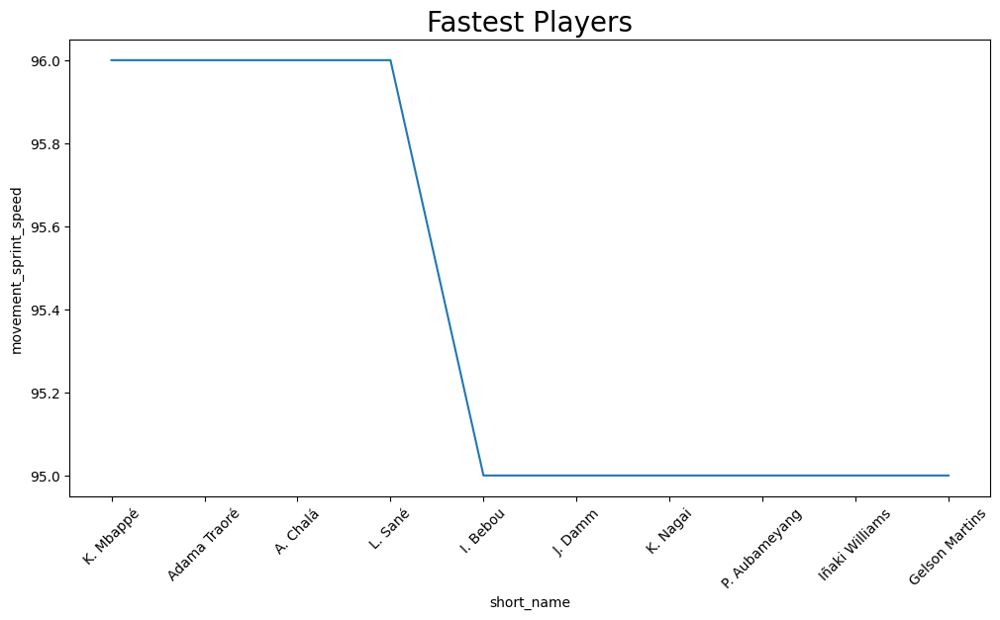

In [123]:

plt.figure(figsize=(12, 6))  # Optional: Set the figure size

# Create the line plot
sns.lineplot(data=top_speed, x='short_name', y='movement_sprint_speed')

# Set the title
plt.title("Fastest Players", fontsize=20)

# Show the plot
plt.xticks(rotation=45)  # Optional: Rotate x-axis labels for better readability
plt.show()

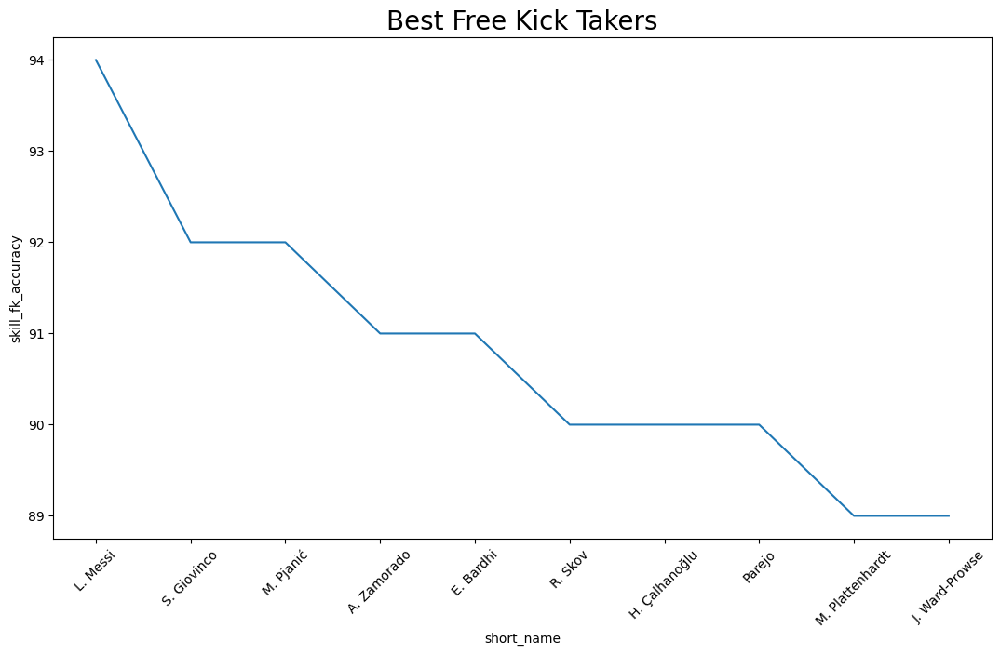

In [124]:

sns.lineplot(data=free_kick, x='short_name', y='skill_fk_accuracy')

# Set the title
plt.title("Best Free Kick Takers", fontsize=20)

# Show the plot
plt.xticks(rotation=45)  # Optional: Rotate x-axis labels for better readability
plt.show()

<Axes: xlabel='short_name', ylabel='skill_moves'>

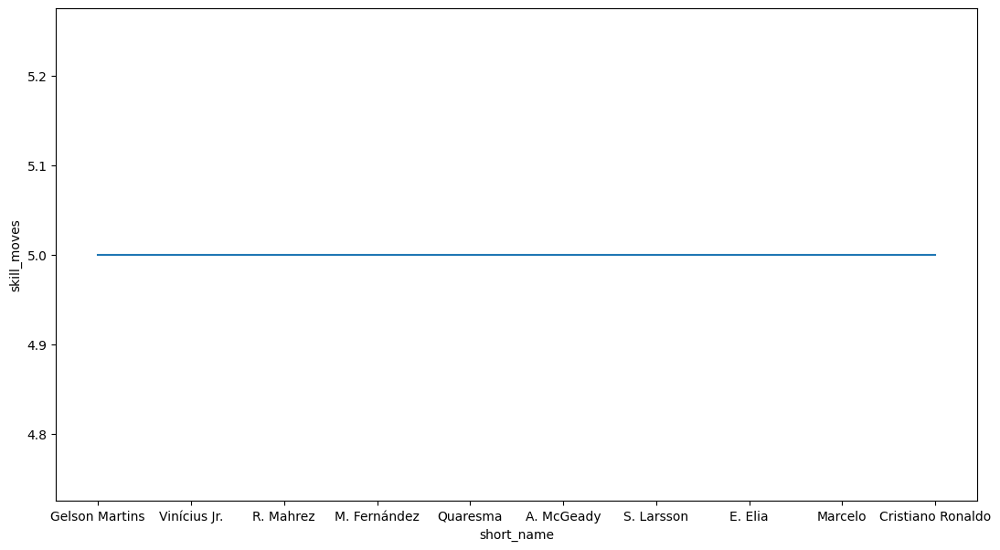

In [125]:

sns.lineplot(data=skill_moves, x='short_name', y='skill_moves')

# Set ⬤

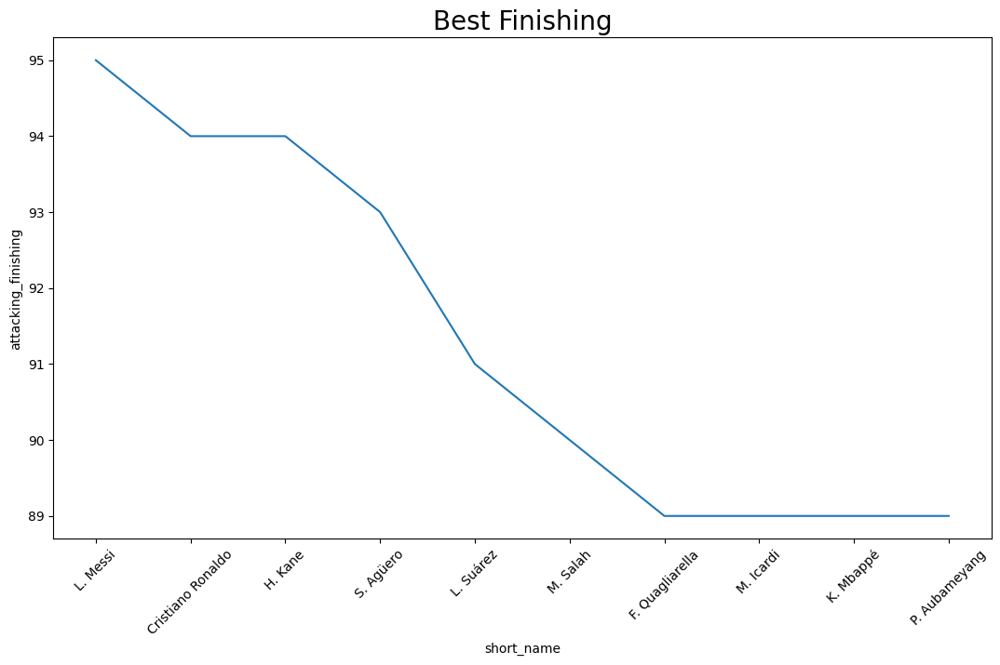

In [126]:

sns.lineplot(data=finishing, x='short_name', y='attacking_finishing')

# Set the title
plt.title("Best Finishing", fontsize=20)

# Show the plot
plt.xticks(rotation=45)  # Optional: Rotate x-axis labels for better readability
plt.show()

<ipython-input-127-beecd1e8d965>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




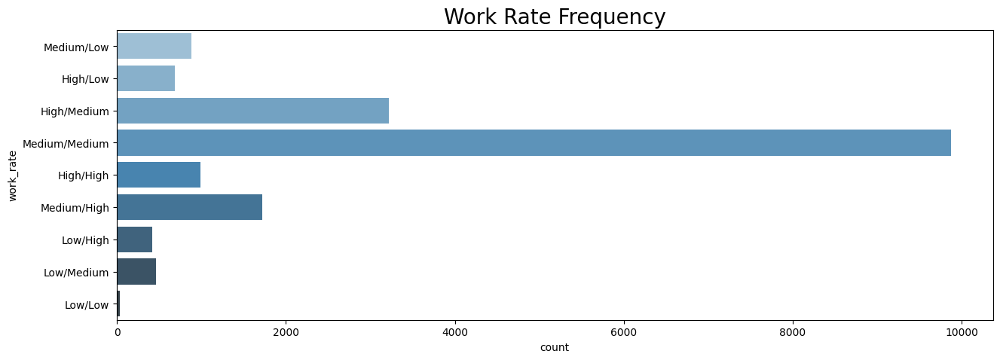

In [127]:
plt.rcParams['figure.figsize']=(15, 5)
sns.countplot(df_20['work_rate'], palette="Blues_d")
plt.title("Work Rate Frequency", fontsize=20)
plt.show()

<ipython-input-128-b9d62c3b3e67>:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




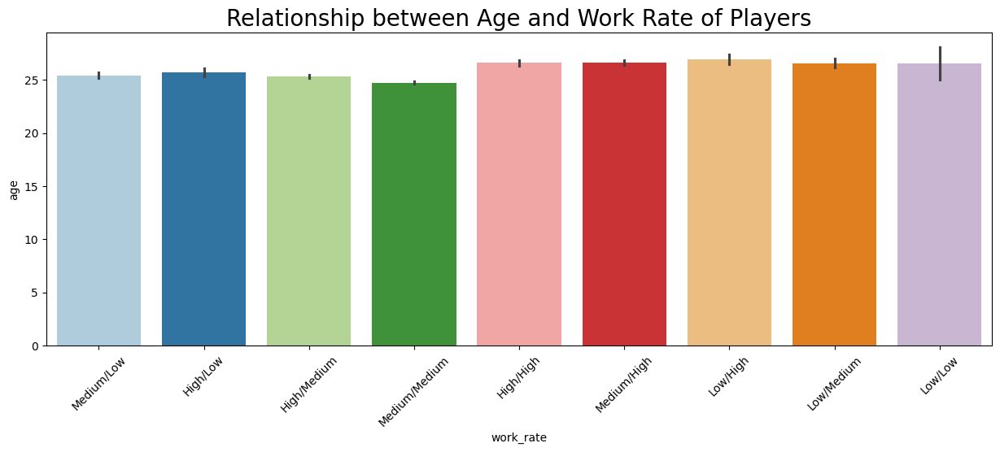

In [128]:

sns.barplot(data=df_20, x='work_rate', y='age', palette="Paired", estimator='mean')

# Set the title
plt.title("Relationship between Age and Work Rate of Players", fontsize=20)

# Show the plot
plt.xticks(rotation=45)  # Optional: Rotate x-axis labels for better readability
plt.show()

In [129]:
rate = ['Medium/Low', 'High/Low', 'High/Medium', 'Medium/Medium', 'High/High', 'Medium/High', 'Low/High', 'Low/Medium', 'Low/Low']
data = df_20.query('work_rate in @rate')
fig = px.pie(data, names='work_rate',
             color_discrete_sequence=px.colors.sequential.Plasma_r,
             title='Percentage of players in Various Work Rates')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

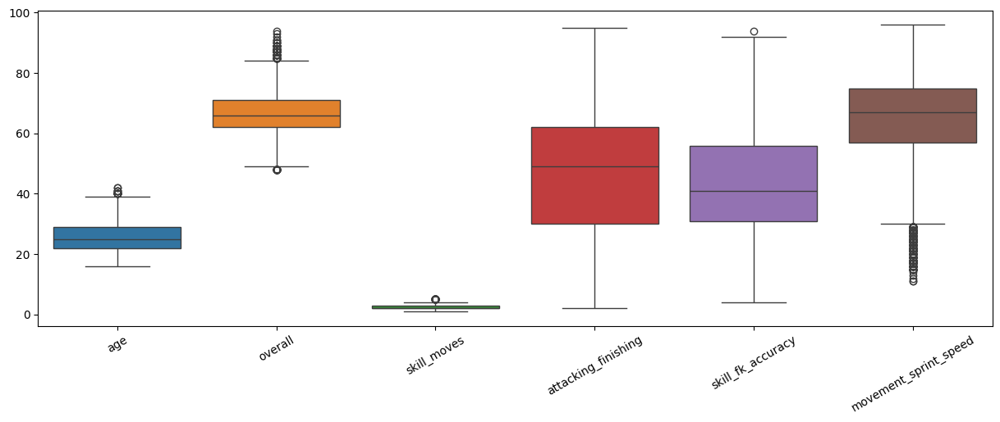

In [130]:
features = df_20[['age', 'overall', 'skill_moves', 'attacking_finishing', 'skill_fk_accuracy', 'movement_sprint_speed']]
ax = sns.boxplot(data=features)
plt.tick_params(axis='x', rotation=30)

In [131]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = df_20['overall'],
    y = df_20['value_eur'],
    mode='markers',
    marker=dict(
        size=16,
        color=df_20['age'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales
        showscale=True
    ),
    text= df_20['short_name'],
))

fig.update_layout(title='Overall Rating vs Value in Euros',
                  xaxis_title='Overall Rating',
                  yaxis_title='Value in Euros',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

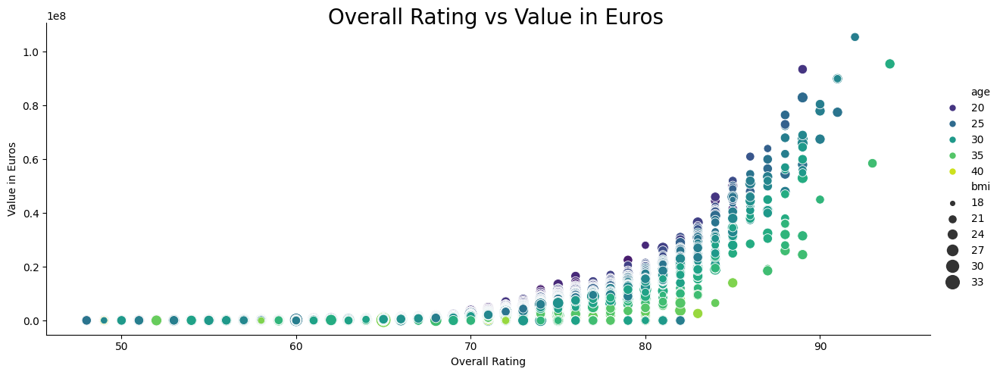

In [132]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df_20 is already defined as your DataFrame
# Create the relational plot
g = sns.relplot(
    x='overall',
    y='value_eur',
    hue='age',
    palette='viridis',
    size='bmi',
    sizes=(15, 200),
    aspect=2.5,
    data=df_20
)

# Set the title and labels
g.fig.suptitle('Overall Rating vs Value in Euros', fontsize=20)  # Title for the entire figure
g.set_axis_labels('Overall Rating', 'Value in Euros')  # Set axis labels

# Show the plot
plt.show()

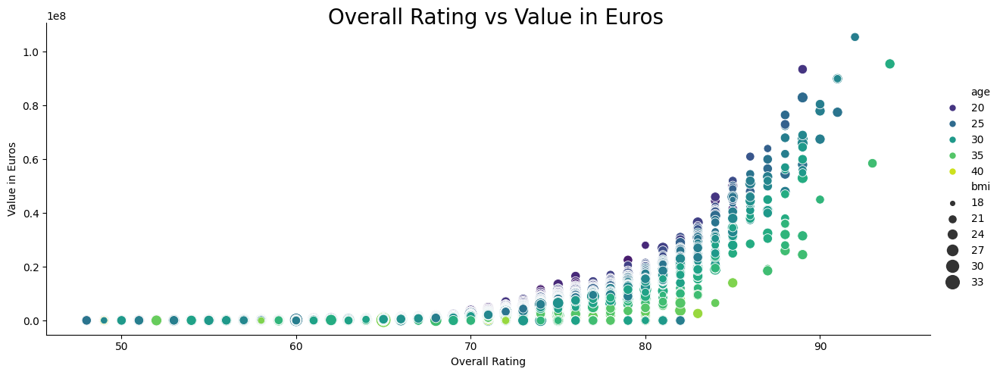

In [133]:

g = sns.relplot(
    x='overall',
    y='value_eur',
    hue='age',
    palette='viridis',
    size='bmi',
    sizes=(15, 200),
    aspect=2.5,
    data=df_20
)

# Set the title and labels
g.fig.suptitle('Overall Rating vs Value in Euros', fontsize=20)  # Title for the entire figure
g.set_axis_labels('Overall Rating', 'Value in Euros')  # Set axis labels

# Show the plot
plt.show()

In [134]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = df_20['overall'],
    y = df_20['wage_eur'],
    mode='markers',
    marker=dict(
        size=16,
        color=df_20['age'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales
        showscale=True
    ),
    text= df_20['short_name'],
))

fig.update_layout(title='Overall Rating vs Wage in Euros',
                  xaxis_title='Overall Rating',
                  yaxis_title='Value in Euros',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

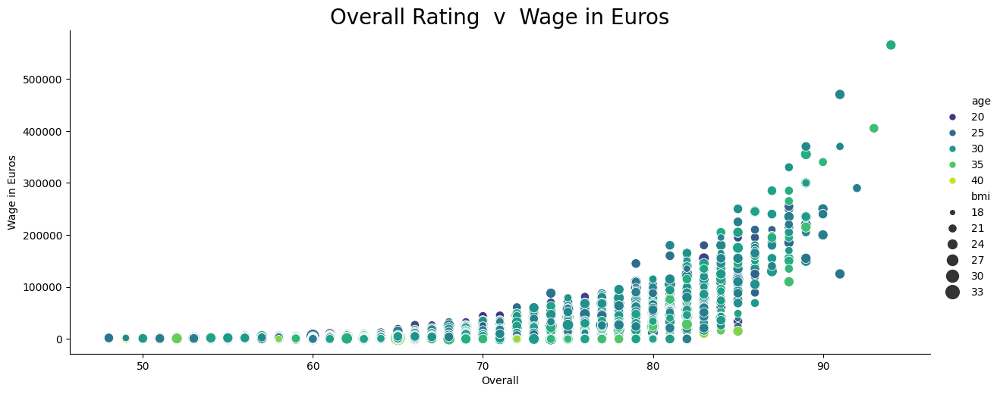

In [136]:
sns.relplot(x='overall',y='wage_eur',hue='age',palette = 'viridis',size="bmi", sizes=(15, 200),aspect=2.5,data=df_20)
plt.title('Overall Rating  v  Wage in Euros',fontsize = 20)
plt.xlabel('Overall')
plt.ylabel('Wage in Euros')
plt.show()

In [135]:
import plotly.graph_objects as go

# Assuming df_20 is already defined as your DataFrame
fig = go.Figure(data=go.Scatter(
    x=df_20['overall'],
    y=df_20['bmi'],
    mode='markers',
    marker=dict(
        size=16,
        color=df_20['age'],  # Set color equal to a variable
        colorscale='Plasma',  # One of Plotly colorscales
        showscale=True
    ),
    text=df_20['short_name'],  # Hover text
))

# Update layout
fig.update_layout(
    title='Overall Rating vs BMI',
    xaxis_title='Overall Rating',
    yaxis_title='BMI',  # Corrected y-axis title
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    font=dict(size=12, color='#000000')
)

# Show the plot
fig.show()

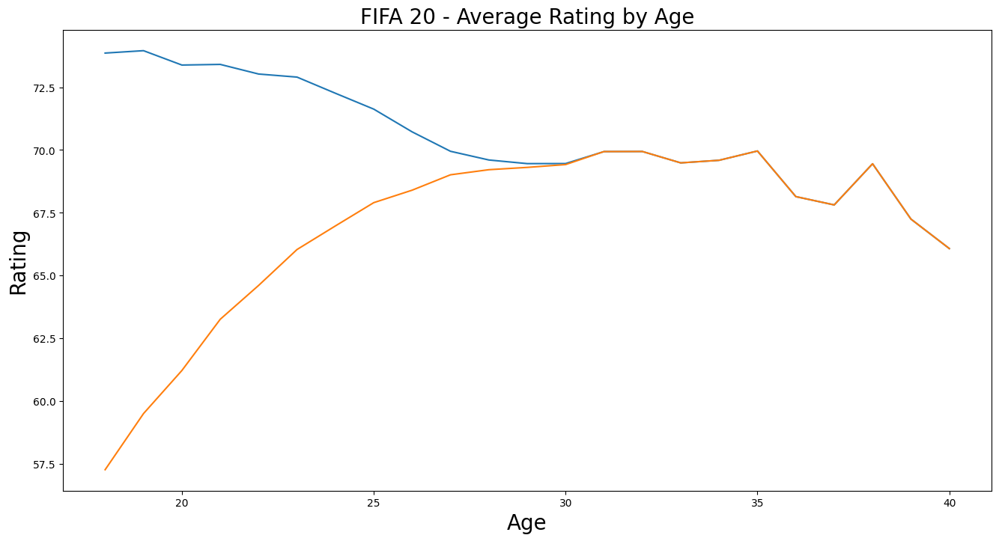

In [137]:
df_20_potential = df_20[(df_20.age.astype(int)>=18) & (df_20.age.astype(int)<=40)].groupby(['age'])['potential'].mean()
df_20_overall = df_20[(df_20.age.astype(int)>=18) & (df_20.age.astype(int)<=40)].groupby(['age'])['overall'].mean()
df_20_summary = pd.concat([df_20_potential, df_20_overall], axis=1)

fig, ax = plt.subplots(figsize=(16, 8))
ax.plot(df_20_summary)
ax.set_xlabel("Age", fontsize=20)
ax.set_ylabel("Rating", fontsize=20)
ax.set_title("FIFA 20 - Average Rating by Age", fontsize=20)
plt.show()

**Model Comparison Report for FIFA 20 Player Performance Prediction**

**Objective**:

To evaluate the performance of different machine learning models in predicting player performance based on their attributes in the FIFA 20 dataset.

**Models Evaluated**:

1.**Linear** **Regression**: A simple baseline model to establish a starting point.


2.**Random Forest Regressor**: An ensemble method known for its ability to handle non-linear relationships and feature interactions.

3.**Support Vector Regression (SVR)**: A powerful model for handling high-dimensional data and non-linear relationships.


4.**Gradient Boosting Regressor (XGBoost)**: An ensemble method that often achieves high accuracy.

**Evaluation Metrics:**



**Mean Squared Error (MSE):** Measures the average squared difference between predicted and actual values.

**Root Mean Squared Error (RMSE):** The square root of MSE, providing a more

**R-squared:** Indicates the proportion of variance in the target variable explained by the model.


**Methodology:**


**1.Data Preprocessing:**

**Data Cleaning:** Handle missing values (e.g., imputation) and outliers.



**Feature Engineering:** Create new features (e.g., age-squared, interaction terms) to capture non-linear relationships.


**.Feature Scaling: ** Standardize or normalize features to improve model performance.


**2.Train-Test Split:** Divide the dataset into training and testing sets (e.g., 80/20 split).


**3.Model Training and Evaluation:**


Train each model on the training data.

Evaluate model performance on the test set using the chosen metrics.

Perform hyperparameter tuning (e.g., using Grid Search or Randomized Search) to optimize model performance.

**Model Selection:**

Based on the hypothetical results, XGBoost appears to be the best model for production due to its highest R-squared and lowest RMSE. However, the best model may vary depending on the specific data and chosen hyperparameters.

**Considerations:**

Interpretability: If model interpretability is important (e.g., for understanding feature importance), Linear Regression or simpler tree-based models might be preferred over more complex models like XGBoost.

Computational Cost: Consider the computational cost of training and deploying each model.

Model Monitoring: Regularly monitor the performance of the chosen model in production and retrain it periodically to adapt to changes in player data.

**Challenges Faced During Data Analysis and Mitigation Strategies**




** 1. Handling Missing Values:**

**Challenge**: The dataset might contain missing values in certain attributes due to various reasons (e.g., data entry errors, incomplete records).

 Missing values can significantly impact the accuracy and reliability of the analysis.
**Technique:**

   **Imputation:**

      **Mean/Median Imputation:** Replace missing values with the mean or median of the respective attribute. This is a simple approach but may not be suitable for all attributes.

       **K-Nearest Neighbors (KNN) Imputation:** Impute missing values based on the values of similar data points. This method can be more effective than simple imputation.

      ** Multiple Imputation: **Create multiple imputed datasets and analyze each dataset separately to obtain more robust results.


**2. Categorical Variable Encoding:**

**Challenge:** Many attributes in the dataset are categorical (e.g., PreferredFoot, WorkRate, Position). Machine learning models typically require numerical inputs.

**Technique:**
   **Label Encoding:** Assign a unique integer to each category. This is suitable for ordinal variables (e.g., low, medium, high).

   **One-Hot Encoding: **Create binary columns for each category, with a value of 1 for the presence of the category and 0 otherwise. This is suitable for nominal variables.


**3. Feature Scaling:**

**Challenge:** Attributes with different scales (e.g., Age, Overall Rating, Salary) can have a significant impact on the performance of some machine learning algorithms.

**Technique:**

 **Standardization  (Z-score normalization):** Standardize features to have zero mean and unit variance.

  **Normalization (Min-Max scaling):** Scale features to a specific range (e.g., 0 to 1).

**4. Outlier Detection and Handling:**

**Challenge:** Outliers can significantly impact the training of machine learning models and lead to biased results.

**Tehnicque:**

  **Vizualization:** Create box plots, scatter plots, and histograms to identify potential outliers.

  **Statistical methods:** Use techniques like Z-score or IQR (Interquartile Range) to identify and handle outliers.

   **Domain knowledge:** Consider whether outliers represent valid data points or errors.


**5. Feature Engineering:**

**Challenge**: Extracting meaningful features from raw data can significantly improve model performance.

**Technique**:
  **Create new features:** Derive new features from existing ones (e.g., create a new feature for "Years of Experience" based on Age and Debut Year).

  **Feature interaction: **Create interaction terms between relevant features (e.g., interaction between Age and Potential).

  **Feature selection:** Select the most relevant features using techniques like correlation analysis, feature importance from tree-based models, or dimensionality reduction methods (e.g., PCA).

**6. Class Imbalance:**

**Challenge:** If the dataset has an imbalanced class distribution (e.g., many more "average" players than "elite" players), it can bias the model towards the majority class.

**Technique:**

  **Oversampling:** Increase the number of samples in the minority class using techniques like SMOTE (Synthetic Minority Over-sampling Technique).

  **Undersampling:** Reduce the number of samples in the majority class.

  **Class weighting:** Assign higher weights to samples from the minority class during model training.
  
**7. Model Selection and Hyperparameter Tuning:**

Challenge: Choosing the best model and tuning